In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
from skimage import color

def show_img(img,color):
    if color == 0:
        plt.imshow(img,cmap='gray')
        plt.show()
    else:
        plt.imshow(img)
        plt.show()
        
def plottie_1d(n,images,strie):
    f, axarr = plt.subplots(1,n)
    f.set_figheight(15*1)
    f.set_figwidth(5*n)

    for j in range(n):
        
        axarr[j].imshow(images[j],cmap='gray')

        axarr[j].set_title(strie[j])

    plt.show()

def plottie_1d(n,images,strie):
    f, axarr = plt.subplots(1,n)
    f.set_figheight(5*1)
    f.set_figwidth(5*n)

    for j in range(n):
        
        axarr[j].imshow(images[j],cmap='gray')

        axarr[j].set_title(strie[j])

    plt.show()

In [2]:
def structuring_element(k,typ):
    
    if typ==0:
        se = np.ones((k,k))
        
    elif typ==1:
        se = np.array([[0,0,0],[1,1,0],[1,1,0]])
        
    elif typ==2: 
        se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(k,k))
        
    return se


In [3]:
def erosion(img,k,typ):

    m,n = img.shape

    img_pad = np.zeros((m+((k//2)*2),n+((k//2)*2))) # Creating the padded image
    m_pad,n_pad = img_pad.shape


    img_pad[k//2:m_pad-k//2,k//2:n_pad-k//2] = img # Including the image in the padded image

    img_final = np.zeros_like(img_pad) # Creating the final image

    se = structuring_element(k,typ)
    
    for i in range(k//2,m_pad-(k//2)): 

        for j in range(k//2,n_pad-(k//2)): 

            row_right = j + k//2 + 1
            row_left = j - k//2
            column_bottom = i+k//2+1
            column_top = i - k//2
            img_slice = img_pad[column_top:column_bottom,row_left:row_right]
            
            if (img_slice == 255*se).all():
                img_final[i,j] = 255

    img_finalest = img_final[k//2:m_pad-k//2,k//2:n_pad-k//2]

    return img_finalest

def dilation(img,k,typ):

    m,n = img.shape

    img_pad = np.zeros((m+((k//2)*2),n+((k//2)*2))) # Creating the padded image
    m_pad,n_pad = img_pad.shape


    img_pad[k//2:m_pad-k//2,k//2:n_pad-k//2] = img # Including the image in the padded image

    img_final = np.zeros_like(img_pad) # Creating the final image
    
    for i in range(k//2,m_pad-(k//2)): 

        for j in range(k//2,n_pad-(k//2)): 

            row_right = j + k//2 + 1
            row_left = j - k//2
            column_bottom = i+k//2+1
            column_top = i - k//2
            img_slice = img_pad[column_top:column_bottom,row_left:row_right]
            
            if 255 in img_slice:
                img_final[i,j] = 255

    img_finalest = img_final[k//2:m_pad-k//2,k//2:n_pad-k//2]

    return img_finalest 

def opening(img,k,typ):
    eroded = erosion(img,k,typ)
    opened = dilation(eroded,k,typ)
    return opened

def closing(img,k,typ):
    dilated = dilation(img,k,typ)
    closed = erosion(dilated,k,typ)
    return closed

## 1

In [137]:
def q1(img,se_ip,amt):
    k=3
#     print(se_ip)
    se = np.rot90(se_ip, amt)
    m,n = img.shape

    img_pad = np.zeros((m+((k//2)*2),n+((k//2)*2))) # Creating the padded image
    m_pad,n_pad = img_pad.shape


    img_pad[k//2:m_pad-k//2,k//2:n_pad-k//2] = img # Including the image in the padded image
#     show_img(img_pad,0)
    img_final = img_pad.copy() # Creating the final image

    mask = (se==-1)
    for i in range(k//2,m_pad-(k//2)): 

        for j in range(k//2,n_pad-(k//2)): 
            
            
#             print(i,j)
            row_right = j + k//2 + 1
            row_left = j - k//2
            column_bottom = i+k//2+1
            column_top = i - k//2
            img_slice = np.copy(img_pad[column_top:column_bottom,row_left:row_right])
             
#             print("slice before")
#             print(img_slice)
            
            img_slice[mask==1] = 0     
            se_copy = se.copy()
            se_copy[mask==1] = 0
            
#             print("slice after")
#             print(img_slice)
#             print(se)
            if (img_slice == 255*se_copy).all():
#                 print("hi")
                img_final[i,j] = 0

    img_finalest = img_final[k//2:m_pad-k//2,k//2:n_pad-k//2]

    return img_finalest

In [205]:
def skeletonize(ip_im):
    se1 = np.array([[0, 0, 0], [-1, 1, -1], [1, 1, 1]])
    se2 = np.array([[-1, 0, 0], [1, 1, 0], [-1, 1, -1]])
    
    curr_im = np.copy(ip_im)
    passes = 0
    while True:
        passes += 1
        print("Pass number", passes)
        ims = []
        temp = q1(curr_im, se1,0)  
#         break
        ims.append(np.copy(temp))
        temp = q1(temp, se2,0)        
        ims.append(np.copy(temp))  
        temp = q1(temp, se1, 1)              
        ims.append(np.copy(temp))
        temp = q1(temp, se2, 1)               
        ims.append(np.copy(temp))
        
        temp = q1(temp, se1, 2)      
        ims.append(np.copy(temp))      
        temp = q1(temp, se2,  2)            
        ims.append(np.copy(temp))       
        temp = q1(temp, se1,  3)            
        ims.append(np.copy(temp))       
        temp = q1(temp, se2,  3)            
        ims.append(np.copy(temp))
        #break when no change
        plottie_1d(8,ims, ["Step 1", "Step 2", "Step 3", "Step 4", "Step 5", "Step 6", "Step 7", "Final"])
        if np.array_equal(curr_im, temp):
            break
        curr_im = np.copy(temp)
# test_img=np.pad(np.full((30, 50), 255, dtype=int), 15, 'constant', constant_values=(0))
# show_img(test_img,0)
# skeletonize(test_img)

# 1.1

Pass number 1


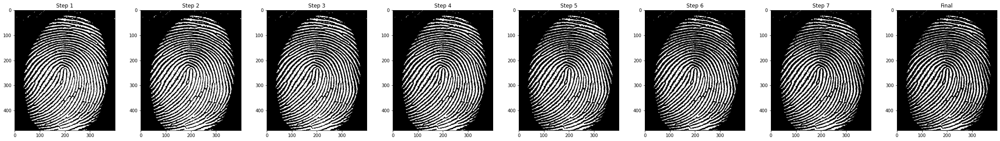

Pass number 2


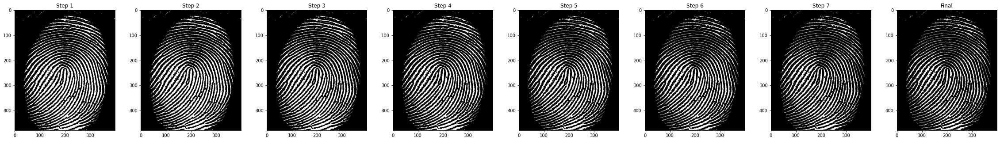

Pass number 3


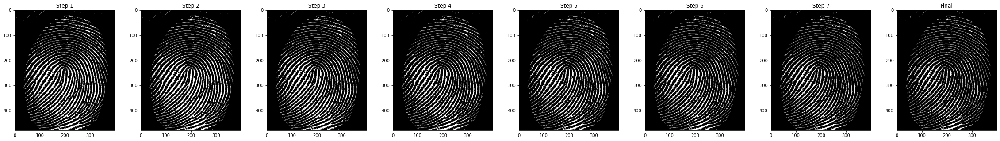

Pass number 4


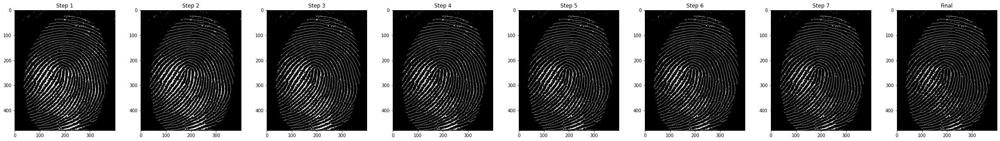

Pass number 5


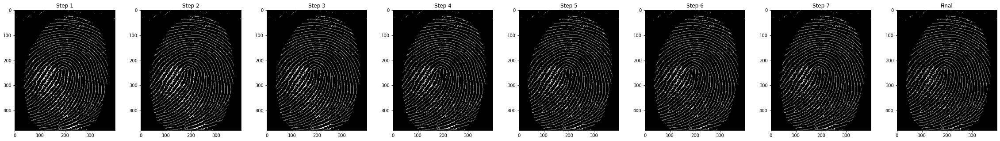

Pass number 6


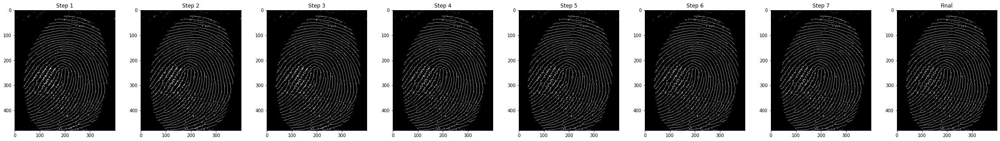

Pass number 7


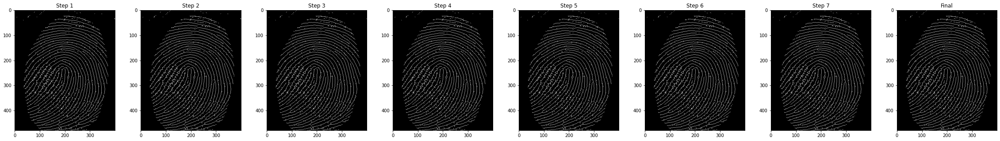

Pass number 8


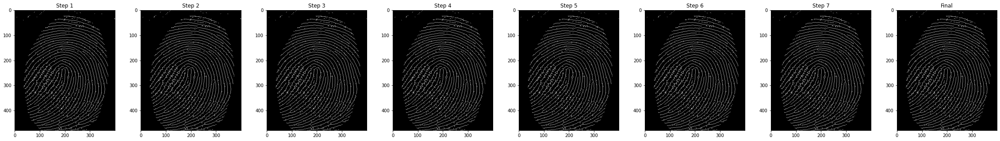

Pass number 9


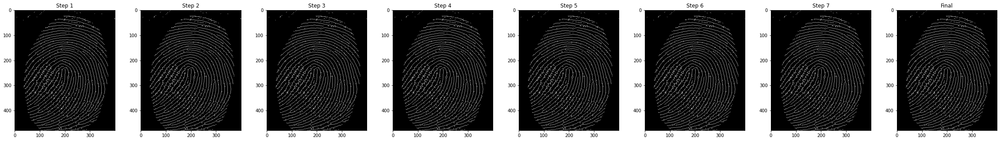

In [206]:
img = cv2.imread("../images/thumb_print.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, img = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY_INV)
skeletonize(img)

# 1.2

- The important point to note here is that, if the structing element matches the given patch of the foregorund, we set it to the background instead of preserving it.
1. Thus, Structing element 1 is used for removing protrusions. This is evident from the protruding type nature of the structuring element itself.
2. Structuring element 2 is used for removing corners. This is evident from the protruding type nature of the structuring element itself which looks like a corner.

# 1.3

1. As we examine the passes, we realize that each pass erodes away part of the boundary. However, since the structuring elements are small compared to the size of the image, we need multiple iterations to achieve the complete effect.
2. We can also observe this in the given images in 1.4. As the size of the image increases from dragon-> butterfly-> keyhole, we can see that the algorithm takes more passes (61,80 and 146 respectively).

# 1.4

Comments-

- As the size of the image increases from dragon-> butterfly-> keyhole, we can see that the algorithm takes more passes (61,80 and 146 respectively).
- The output of the skeletonization of the keyhole image is slightly different from the others due to the hole present in the image.

Pass number 1


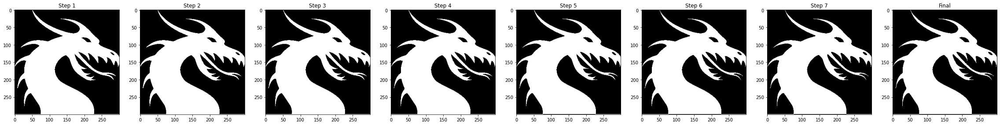

Pass number 2


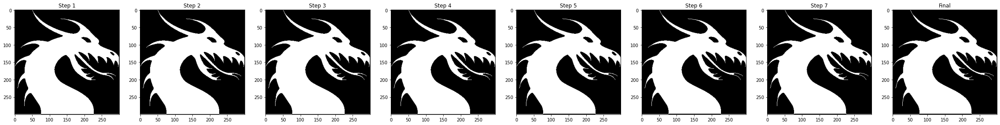

Pass number 3


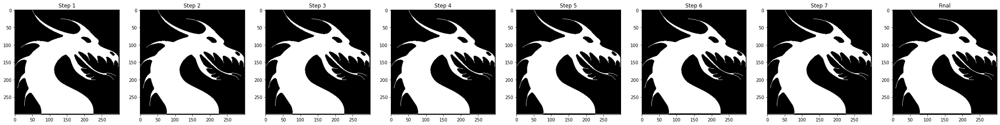

Pass number 4


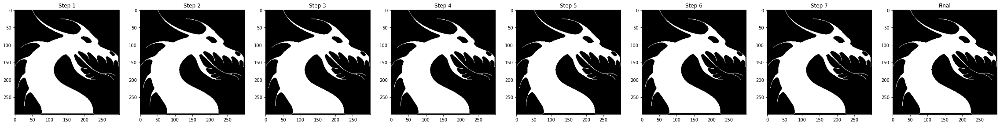

Pass number 5


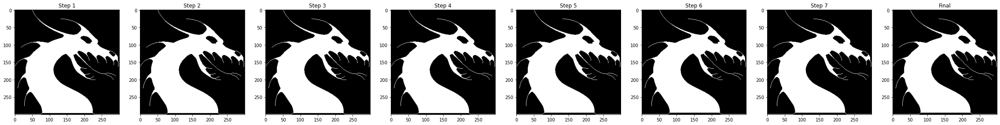

Pass number 6


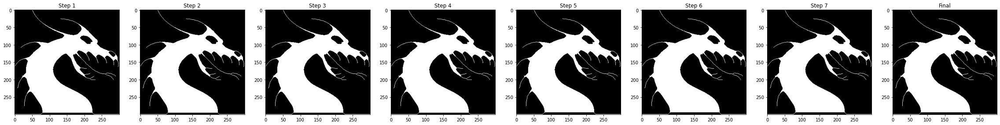

Pass number 7


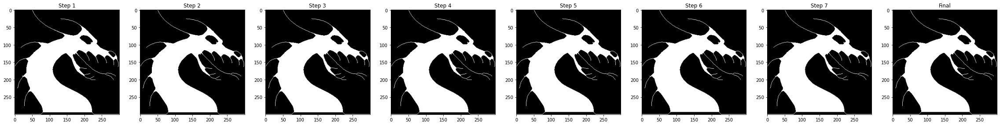

Pass number 8


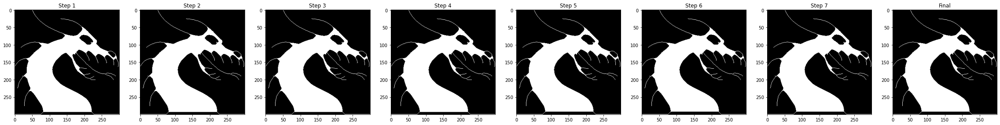

Pass number 9


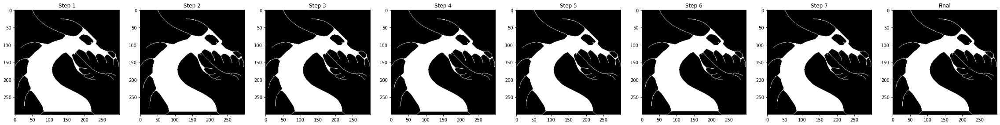

Pass number 10


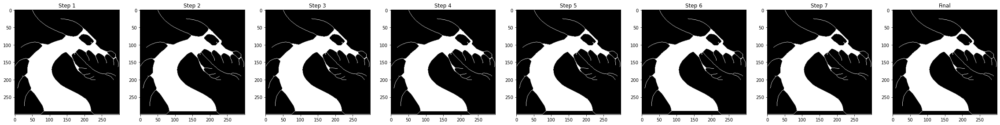

Pass number 11


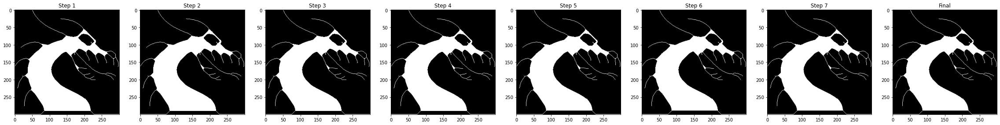

Pass number 12


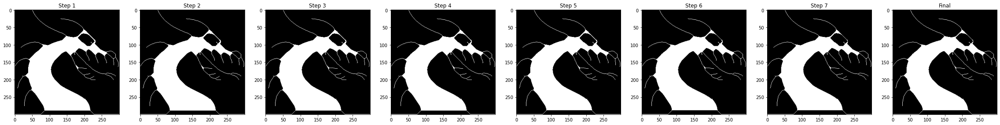

Pass number 13


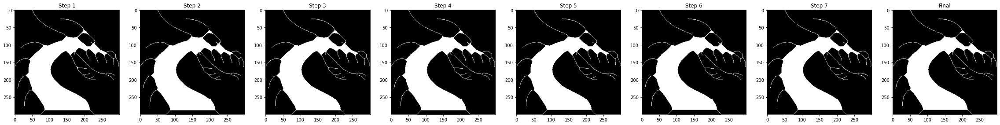

Pass number 14


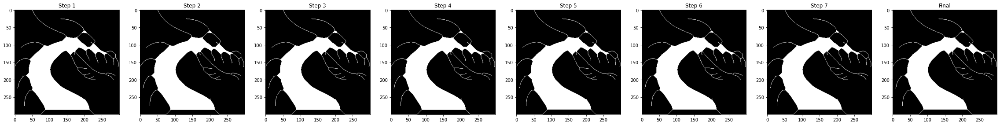

Pass number 15


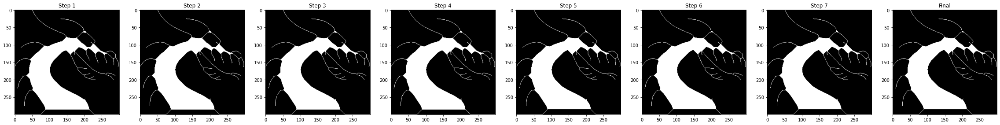

Pass number 16


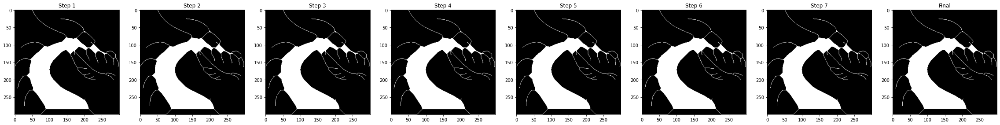

Pass number 17


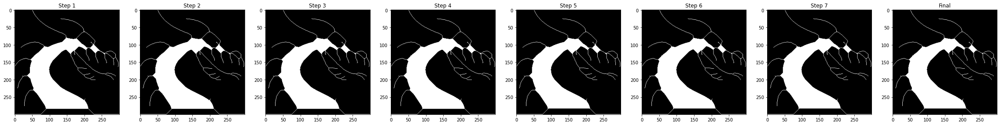

Pass number 18


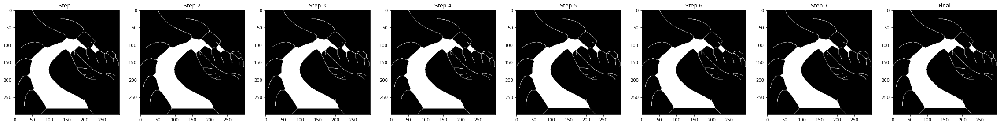

Pass number 19


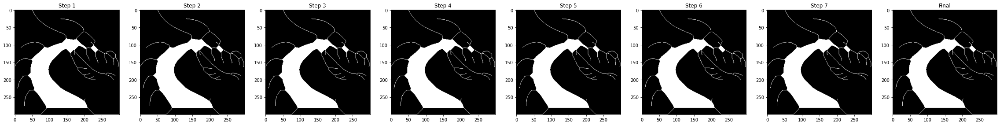

Pass number 20


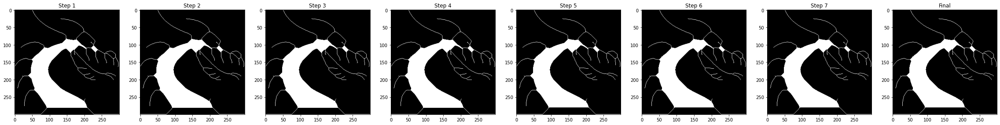

Pass number 21


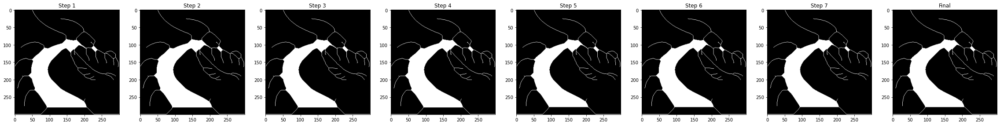

Pass number 22


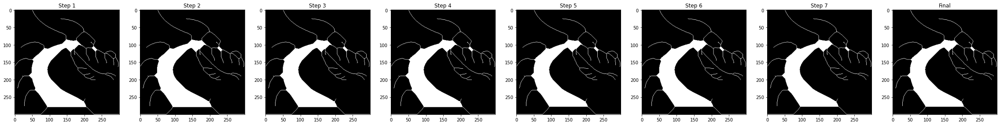

Pass number 23


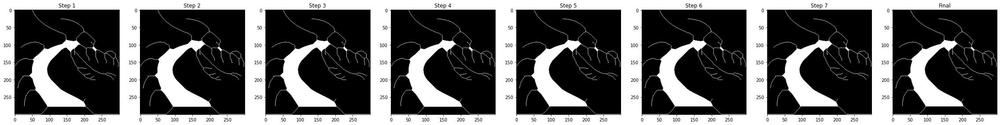

Pass number 24


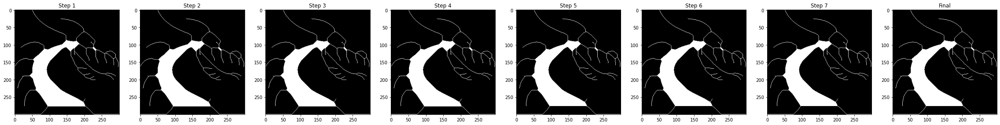

Pass number 25


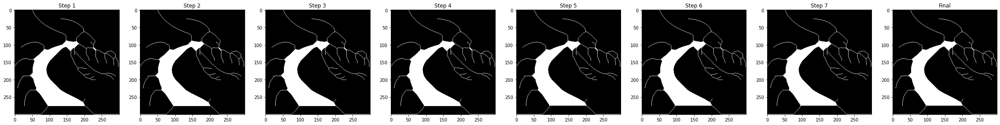

Pass number 26


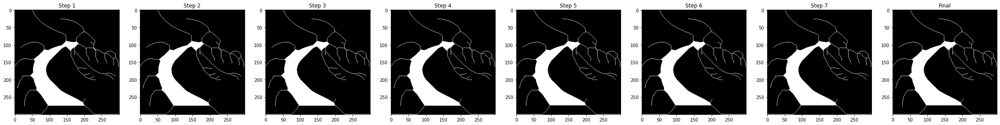

Pass number 27


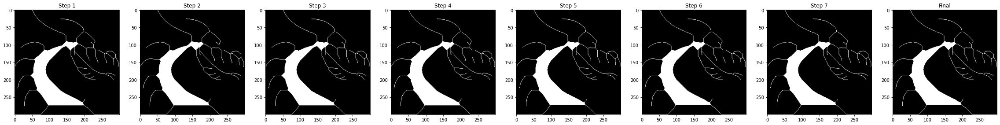

Pass number 28


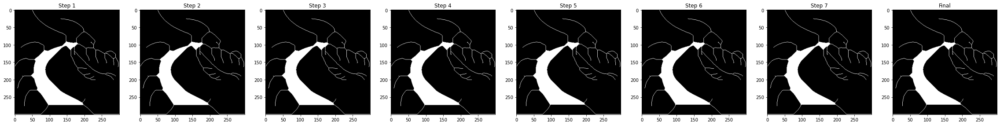

Pass number 29


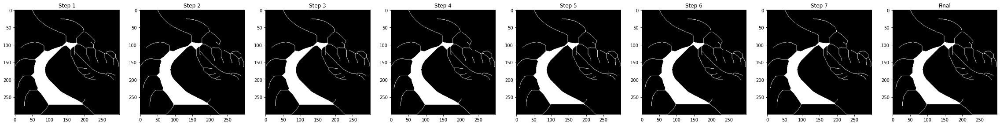

Pass number 30


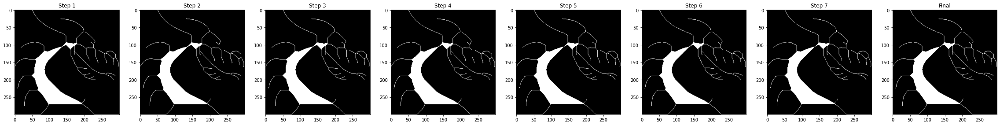

Pass number 31


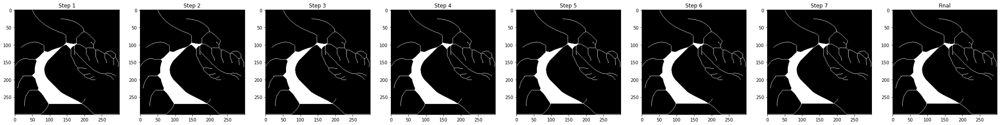

Pass number 32


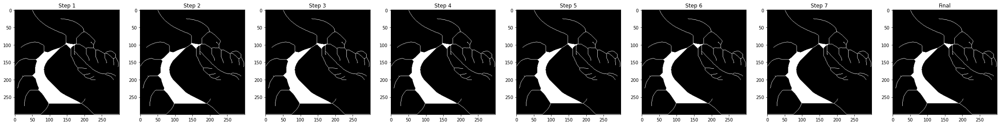

Pass number 33


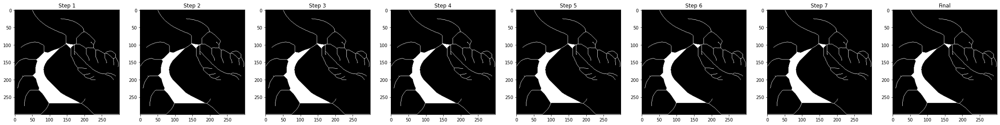

Pass number 34


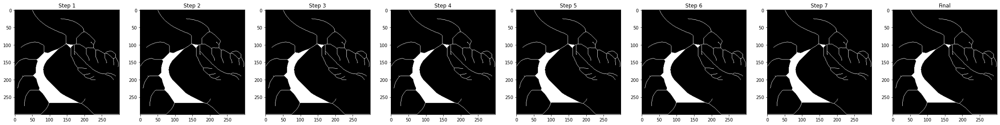

Pass number 35


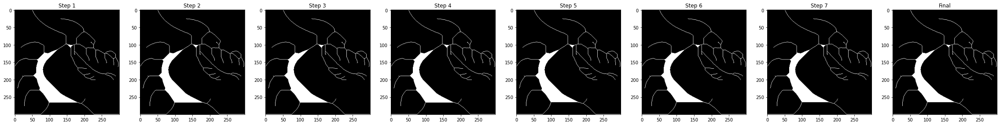

Pass number 36


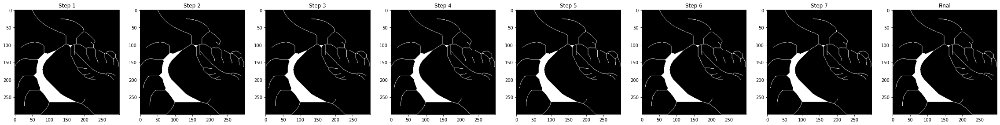

Pass number 37


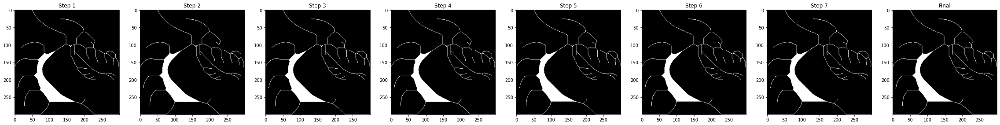

Pass number 38


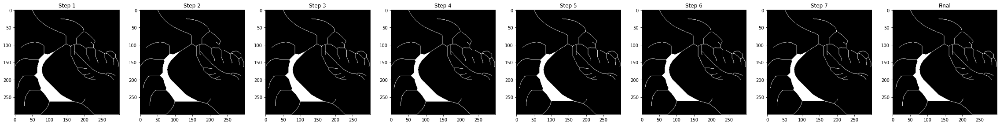

Pass number 39


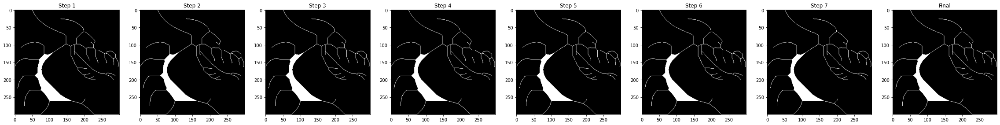

Pass number 40


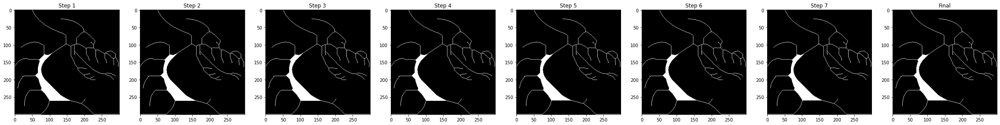

Pass number 41


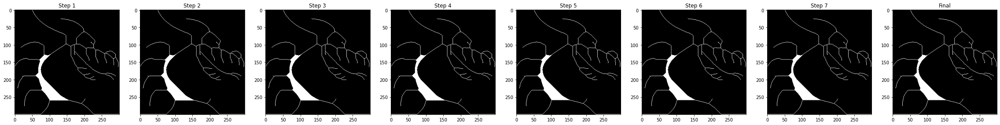

Pass number 42


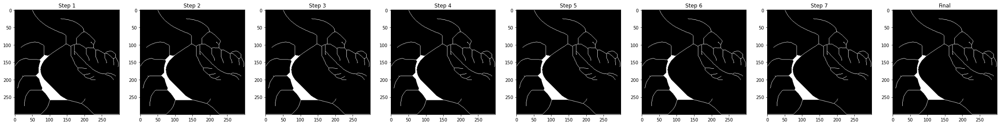

Pass number 43


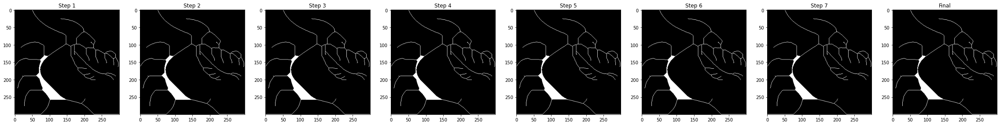

Pass number 44


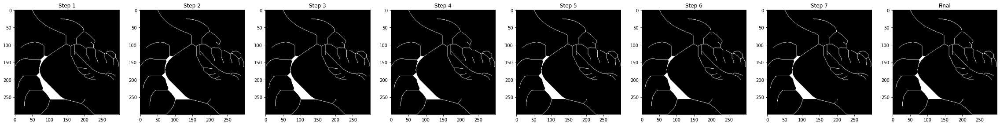

Pass number 45


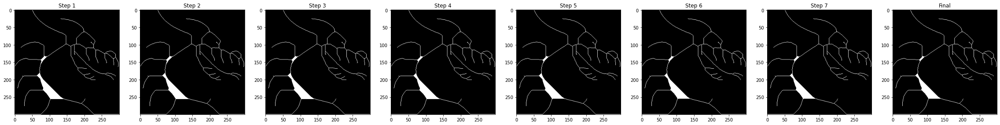

Pass number 46


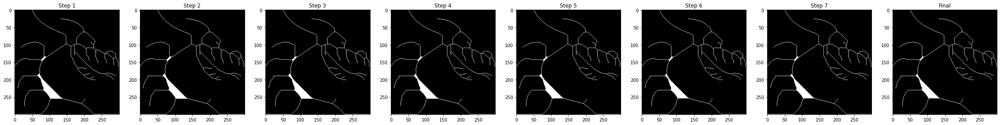

Pass number 47


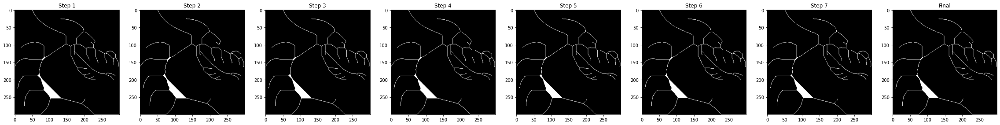

Pass number 48


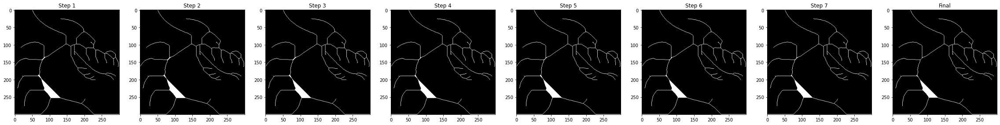

Pass number 49


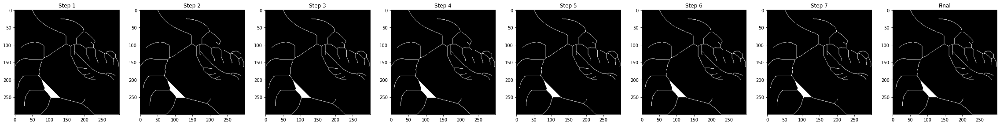

Pass number 50


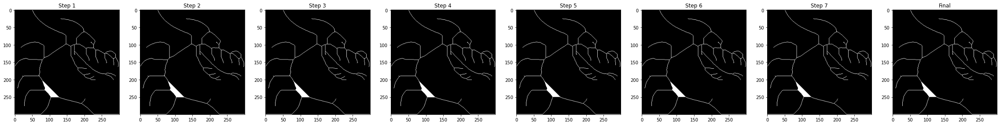

Pass number 51


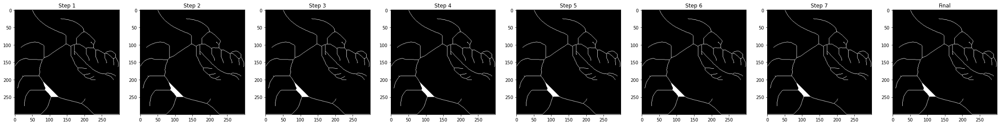

Pass number 52


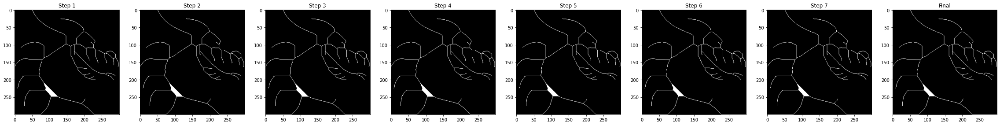

Pass number 53


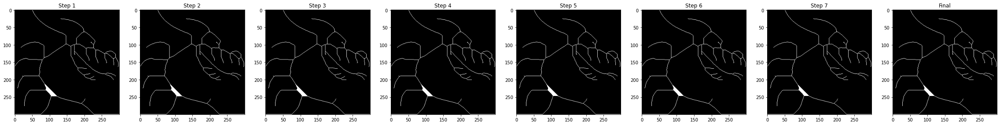

Pass number 54


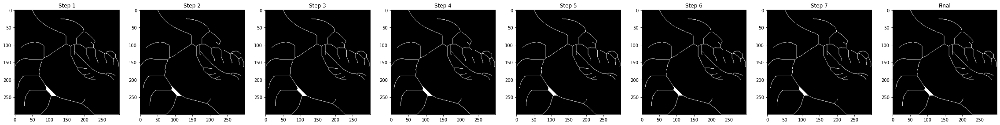

Pass number 55


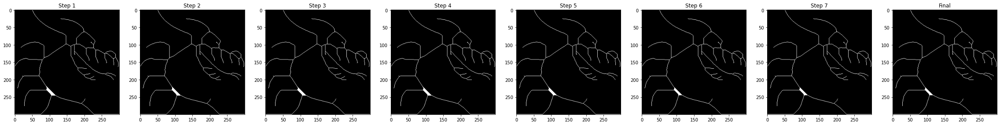

Pass number 56


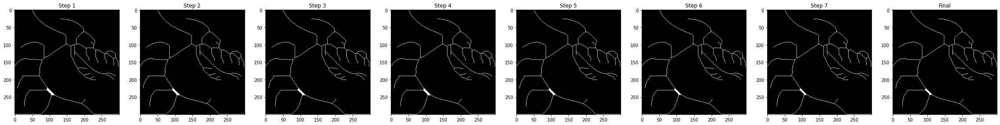

Pass number 57


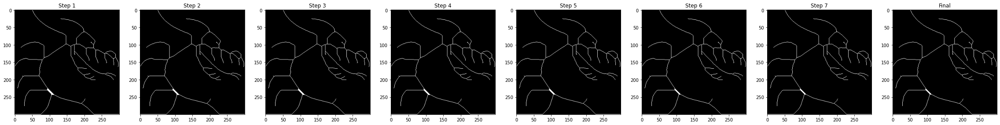

Pass number 58


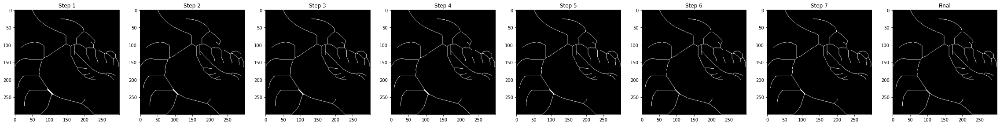

Pass number 59


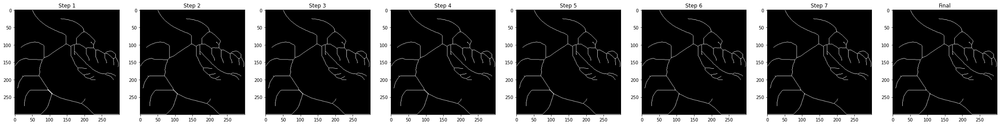

Pass number 60


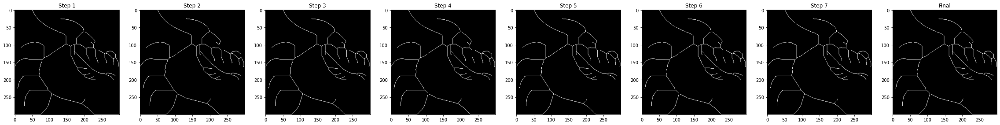

Pass number 61


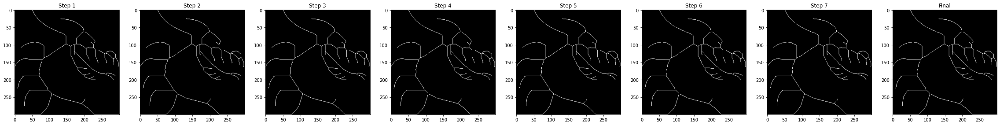

In [207]:
img = cv2.imread("../images/dragon.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, img = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)
skeletonize(img)

Pass number 1


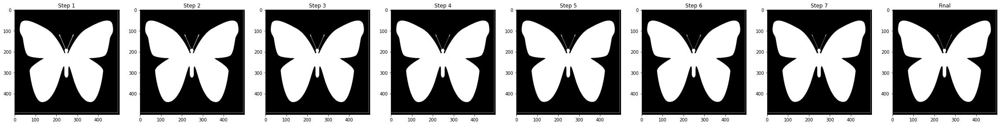

Pass number 2


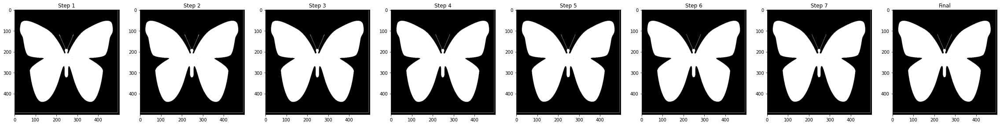

Pass number 3


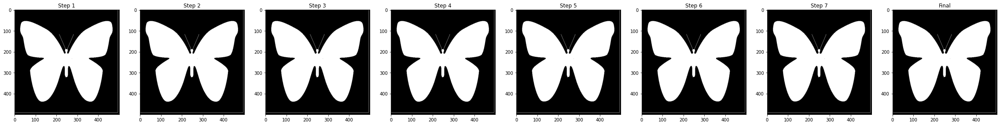

Pass number 4


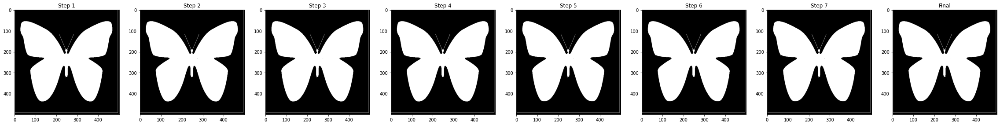

Pass number 5


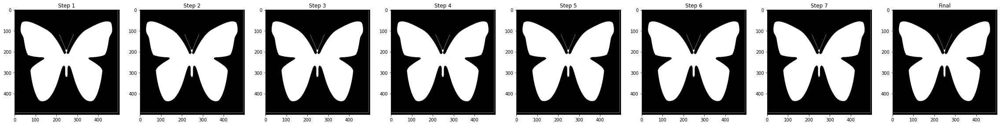

Pass number 6


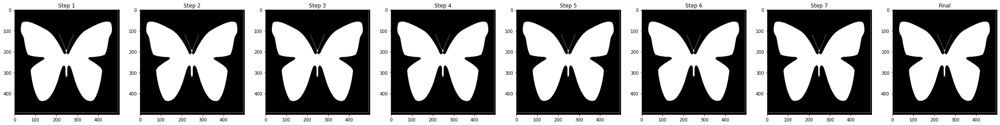

Pass number 7


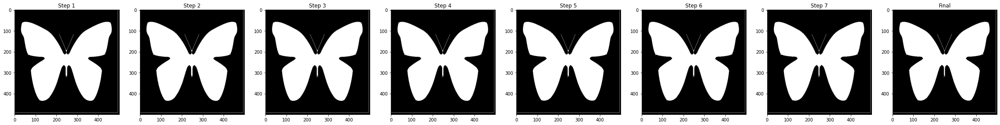

Pass number 8


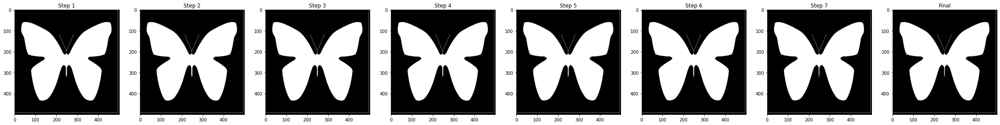

Pass number 9


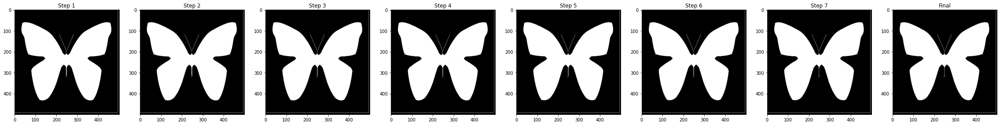

Pass number 10


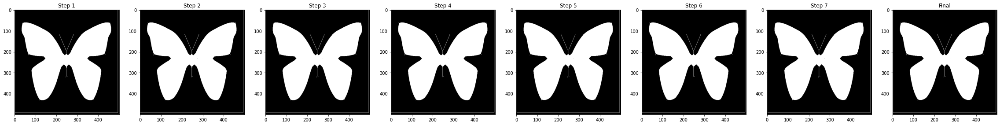

Pass number 11


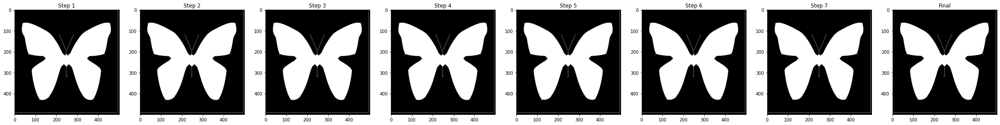

Pass number 12


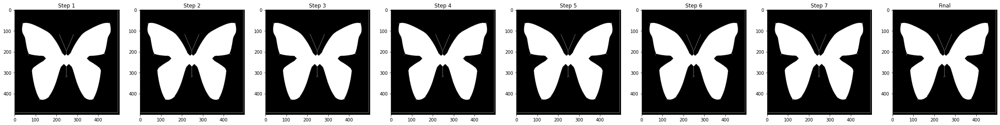

Pass number 13


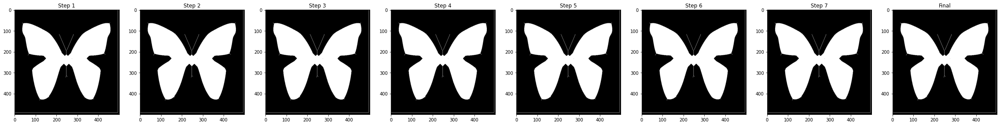

Pass number 14


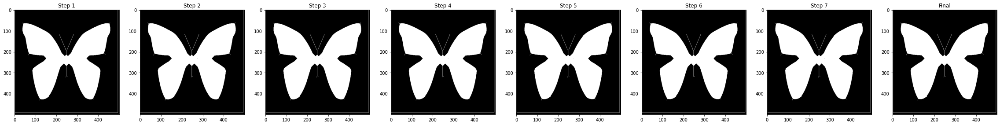

Pass number 15


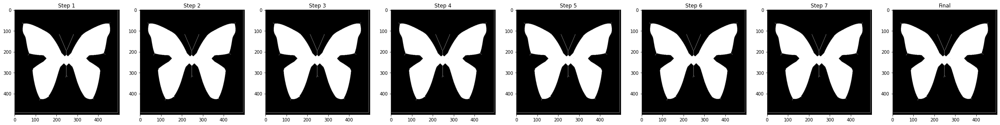

Pass number 16


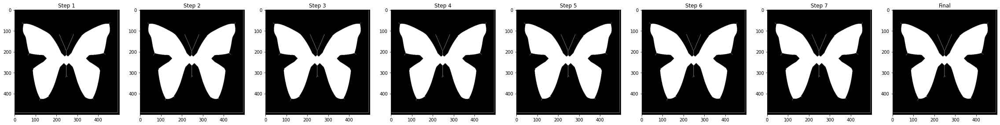

Pass number 17


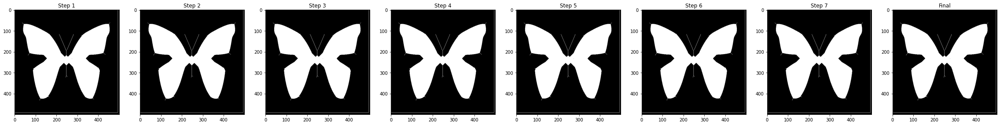

Pass number 18


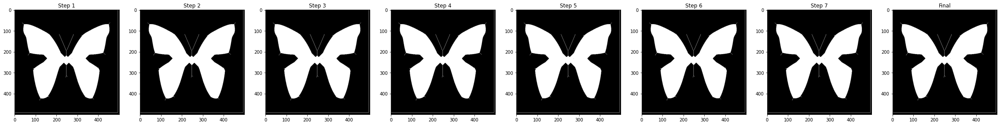

Pass number 19


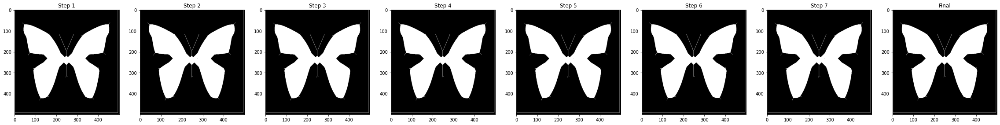

Pass number 20


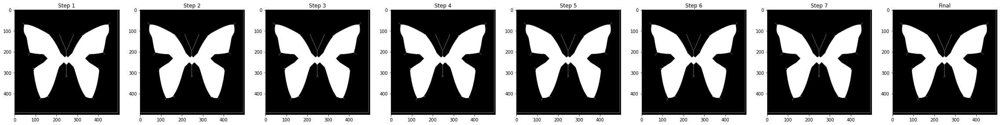

Pass number 21


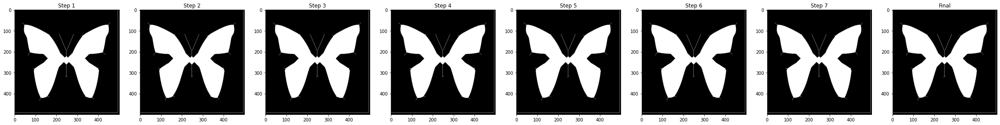

Pass number 22


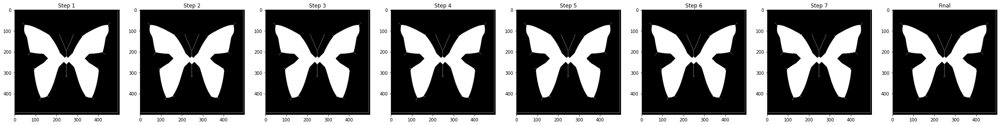

Pass number 23


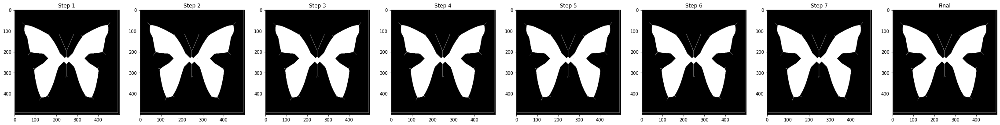

Pass number 24


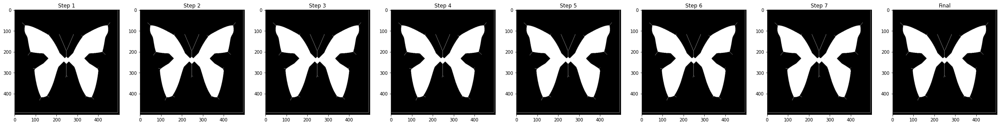

Pass number 25


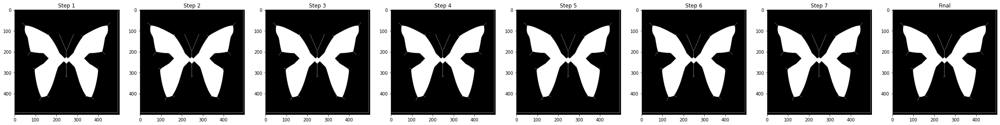

Pass number 26


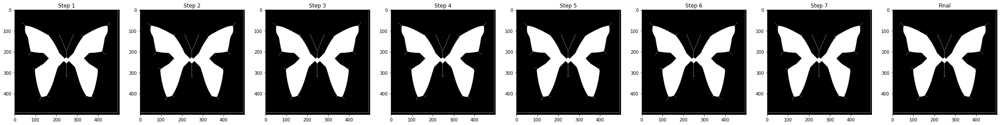

Pass number 27


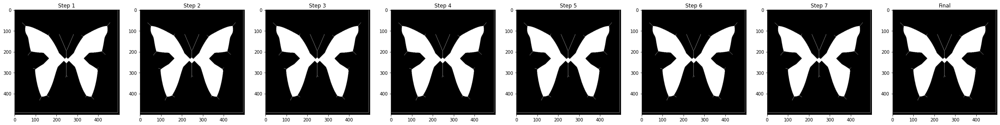

Pass number 28


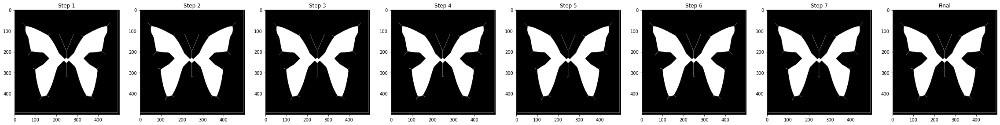

Pass number 29


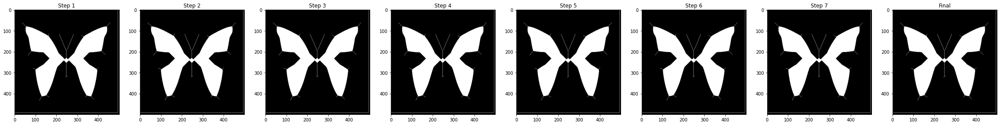

Pass number 30


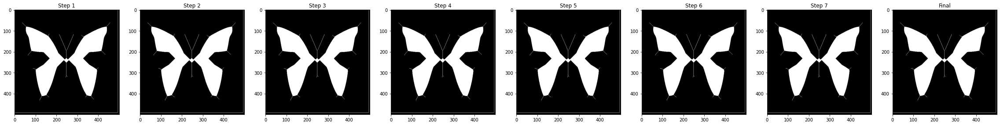

Pass number 31


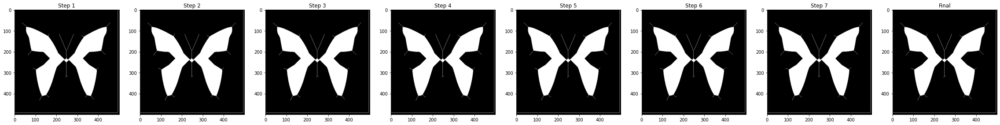

Pass number 32


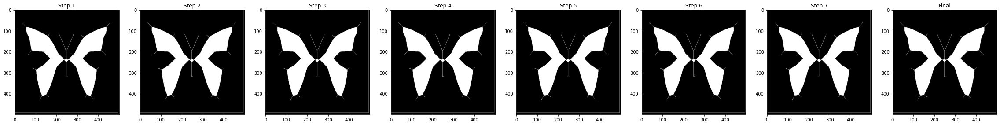

Pass number 33


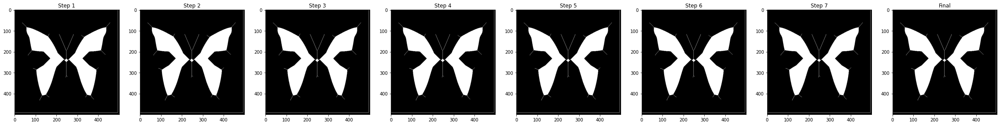

Pass number 34


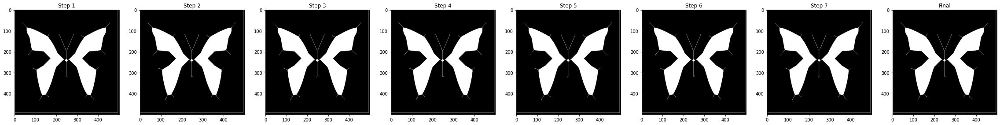

Pass number 35


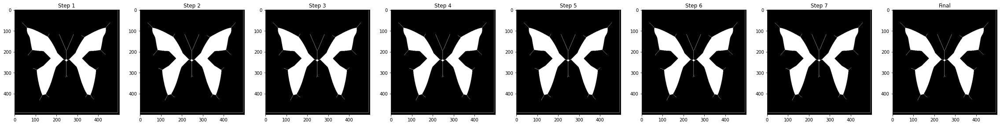

Pass number 36


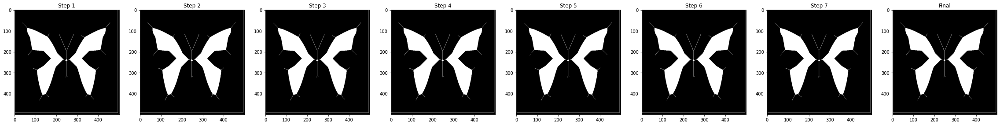

Pass number 37


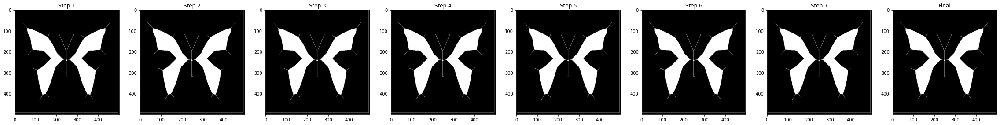

Pass number 38


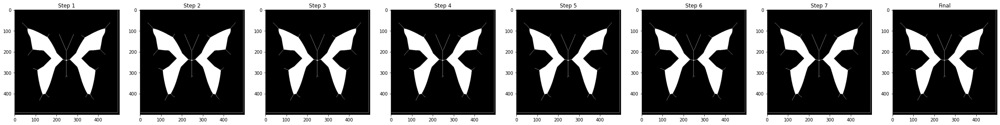

Pass number 39


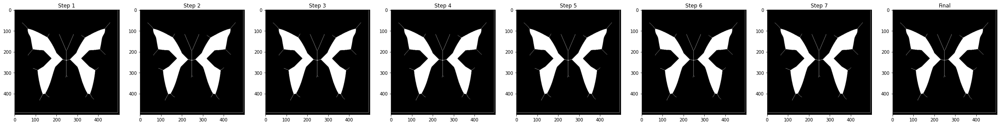

Pass number 40


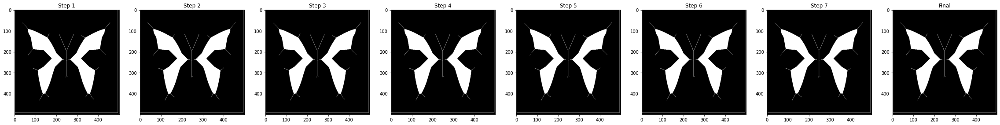

Pass number 41


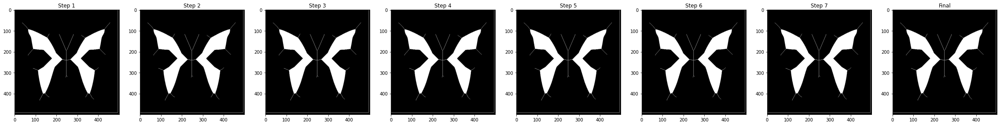

Pass number 42


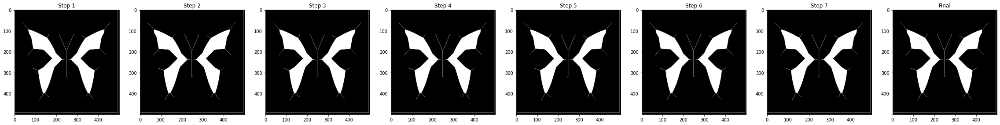

Pass number 43


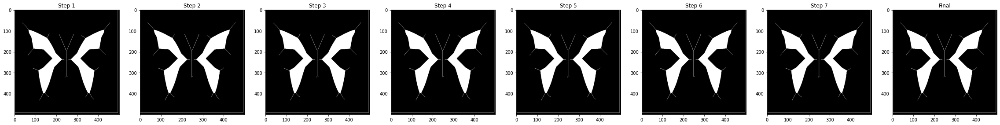

Pass number 44


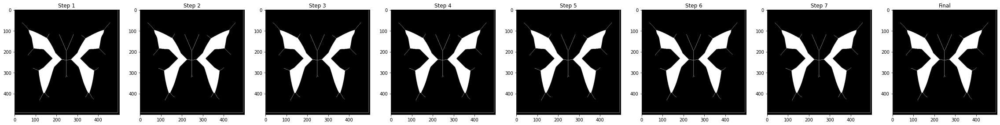

Pass number 45


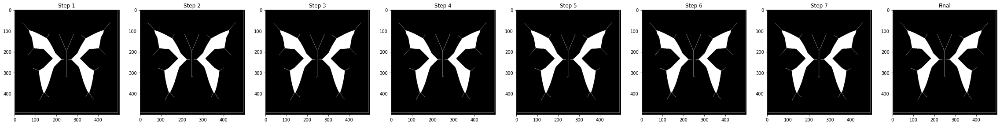

Pass number 46


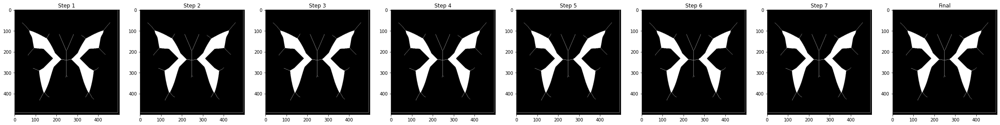

Pass number 47


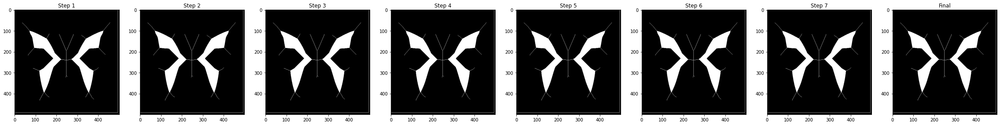

Pass number 48


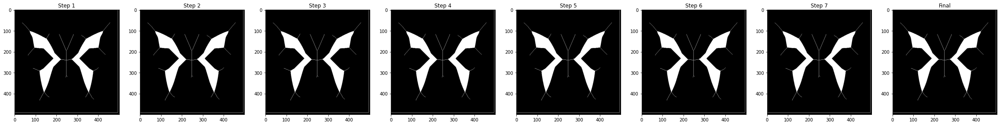

Pass number 49


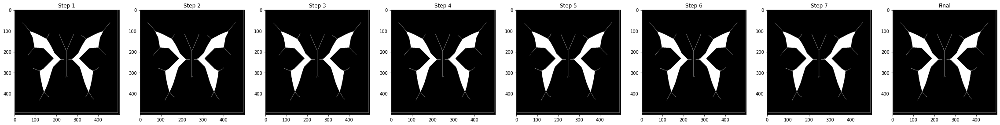

Pass number 50


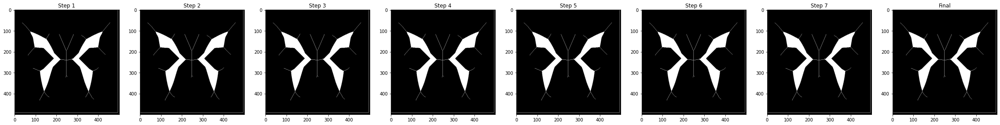

Pass number 51


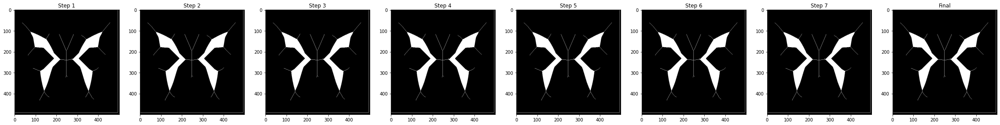

Pass number 52


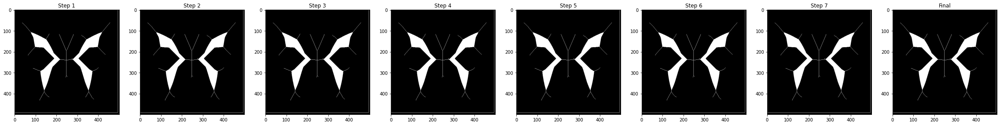

Pass number 53


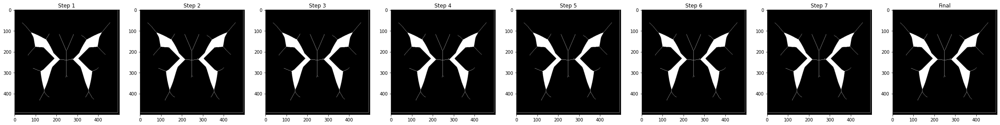

Pass number 54


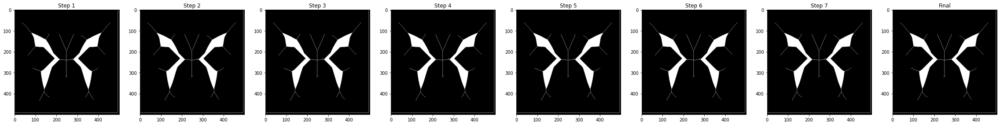

Pass number 55


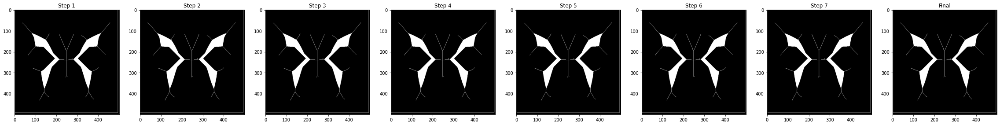

Pass number 56


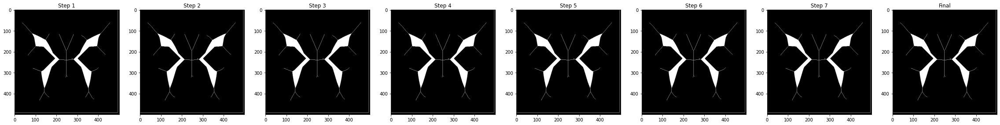

Pass number 57


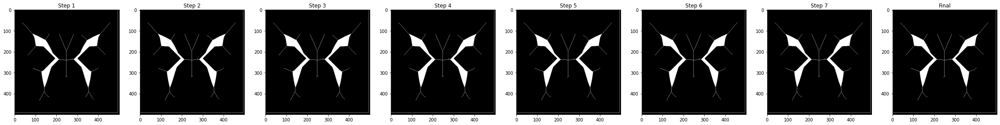

Pass number 58


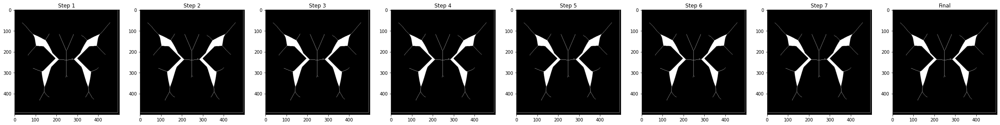

Pass number 59


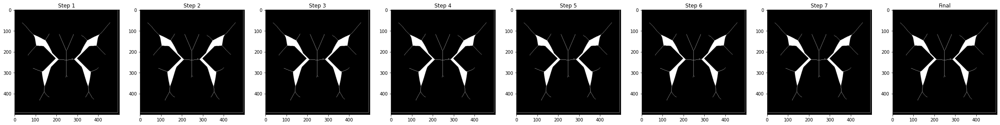

Pass number 60


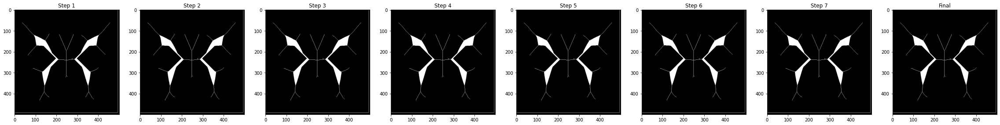

Pass number 61


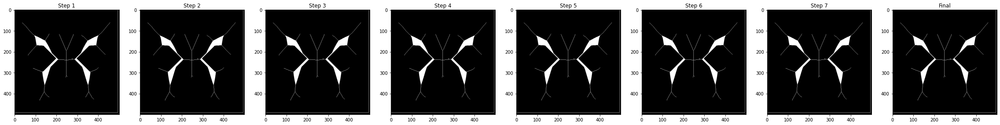

Pass number 62


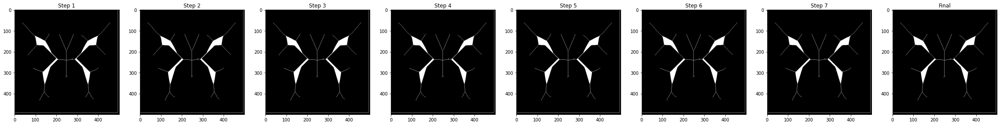

Pass number 63


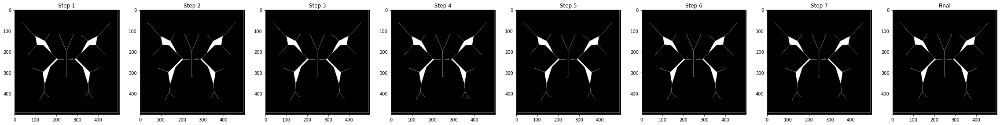

Pass number 64


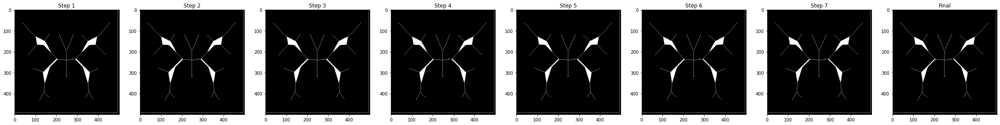

Pass number 65


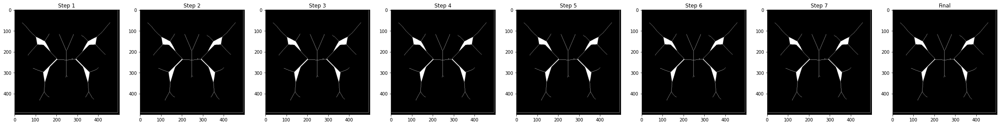

Pass number 66


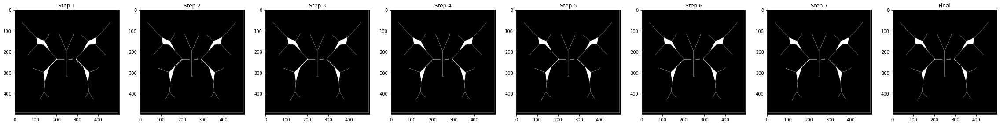

Pass number 67


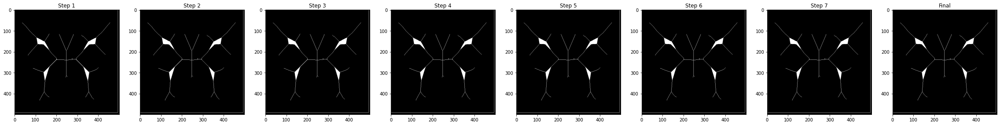

Pass number 68


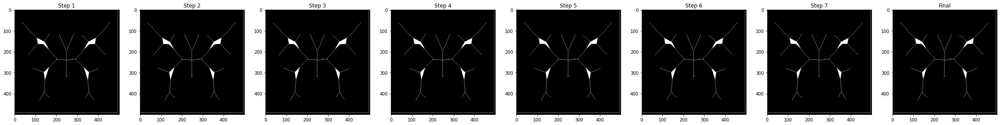

Pass number 69


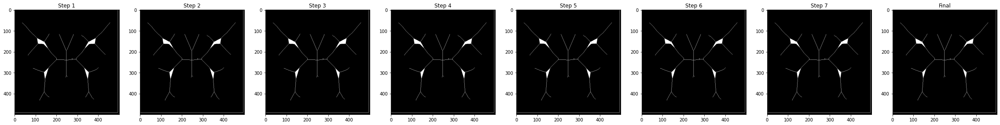

Pass number 70


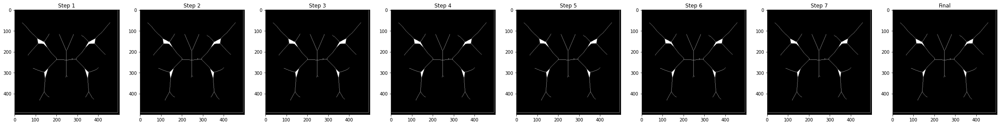

Pass number 71


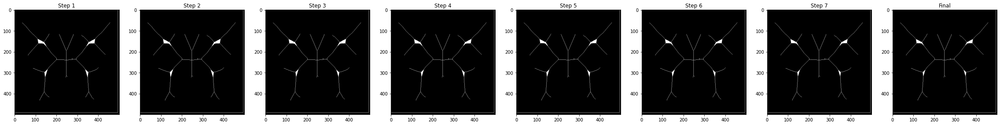

Pass number 72


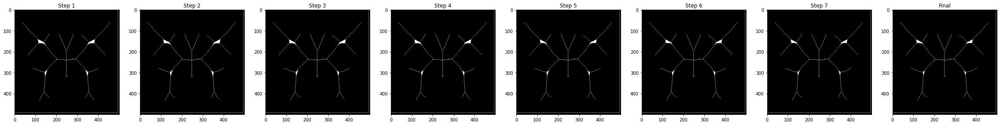

Pass number 73


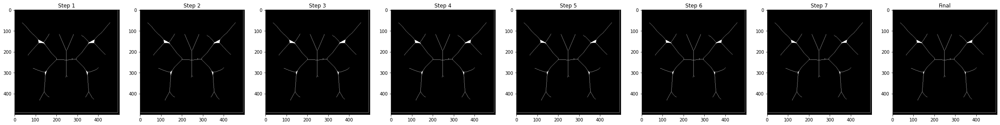

Pass number 74


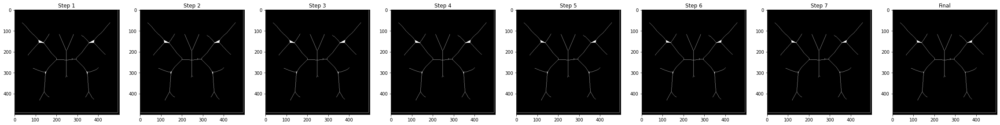

Pass number 75


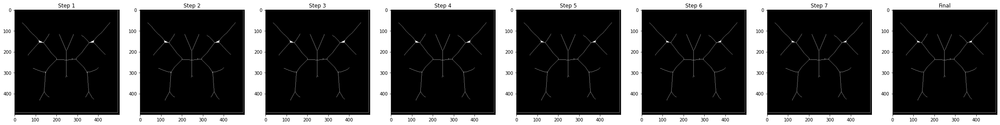

Pass number 76


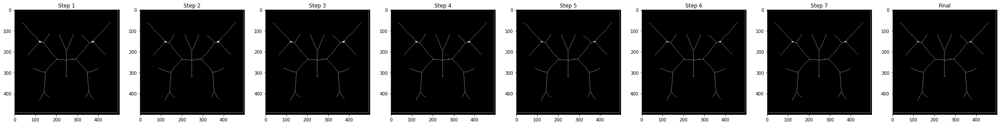

Pass number 77


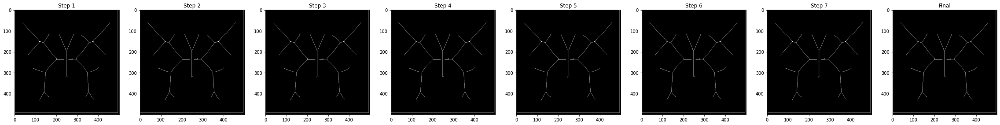

Pass number 78


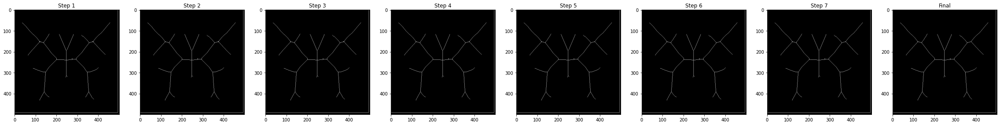

Pass number 79


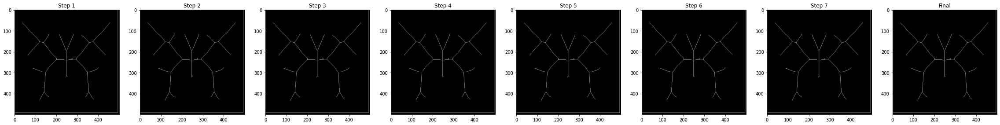

Pass number 80


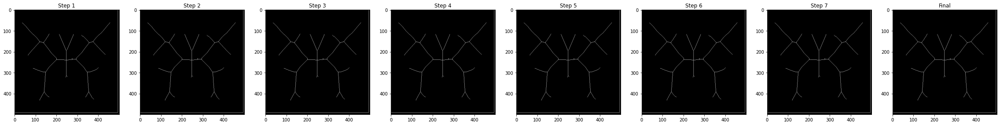

In [208]:
img = cv2.imread("../images/butterfly.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, img = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)
skeletonize(img)

Pass number 1


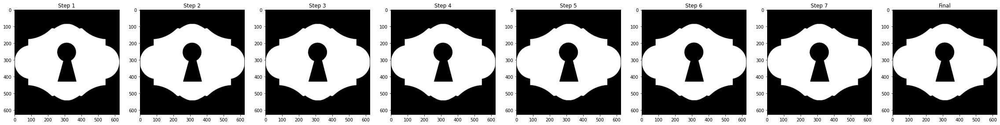

Pass number 2


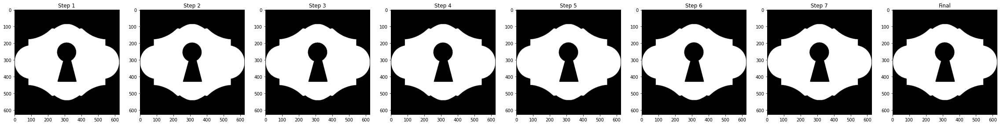

Pass number 3


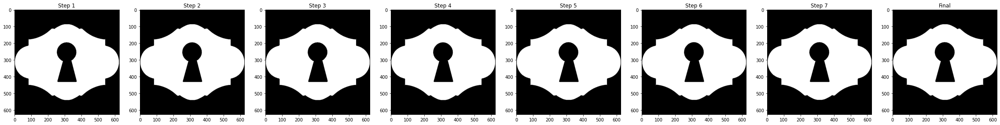

Pass number 4


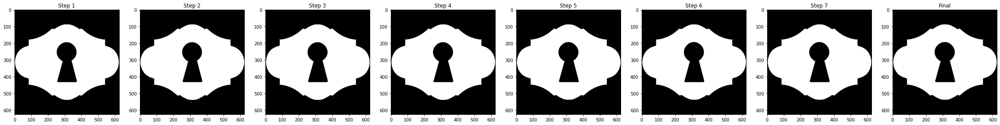

Pass number 5


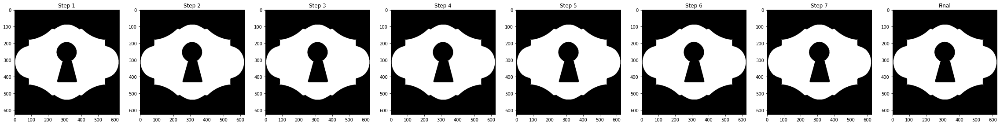

Pass number 6


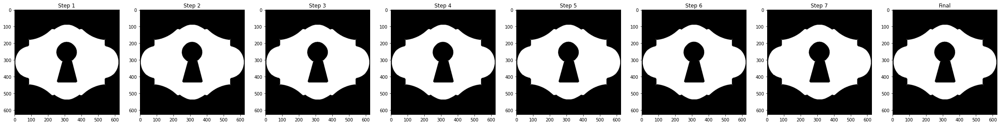

Pass number 7


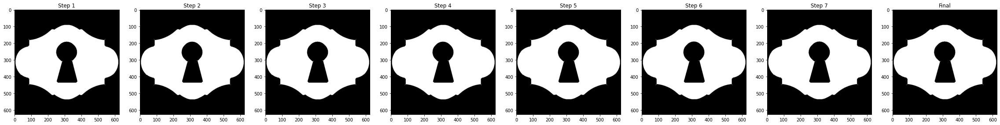

Pass number 8


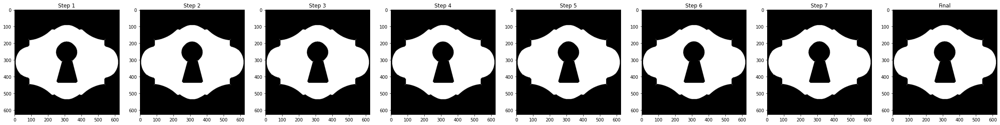

Pass number 9


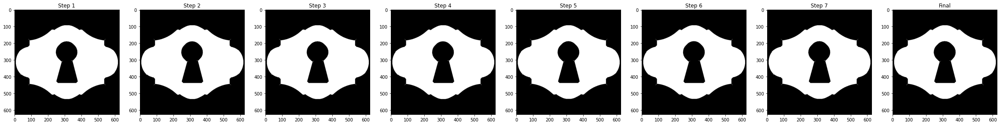

Pass number 10


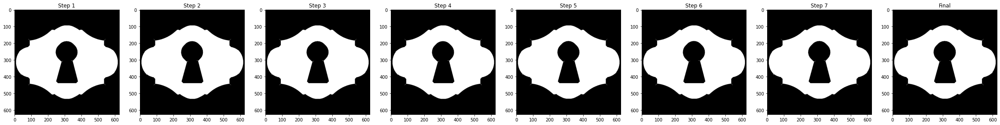

Pass number 11


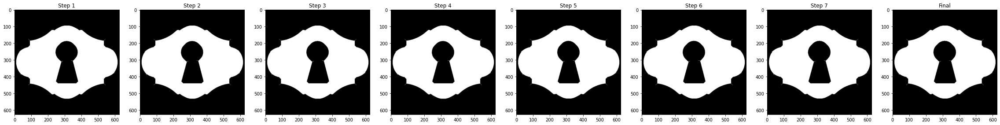

Pass number 12


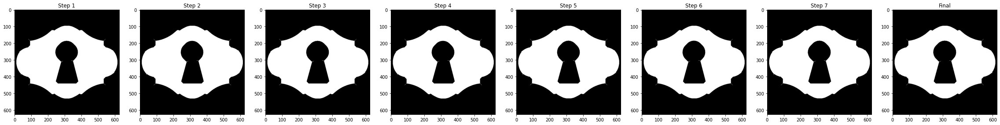

Pass number 13


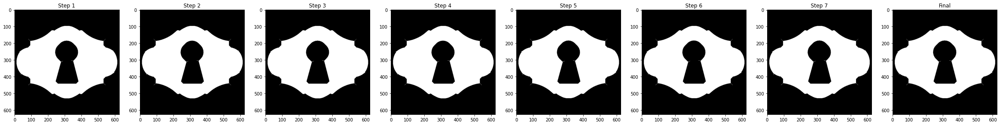

Pass number 14


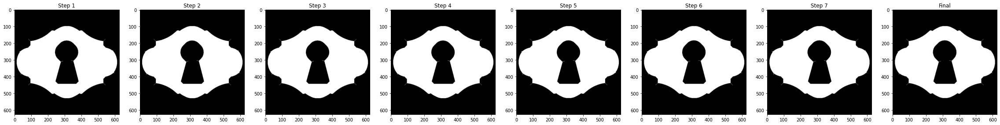

Pass number 15


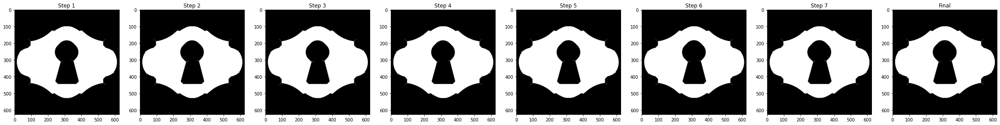

Pass number 16


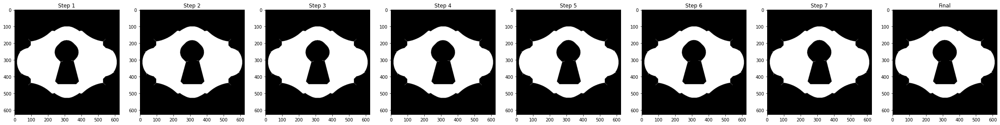

Pass number 17


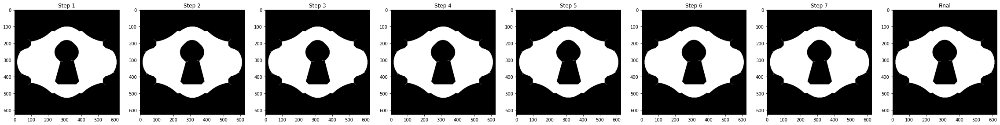

Pass number 18


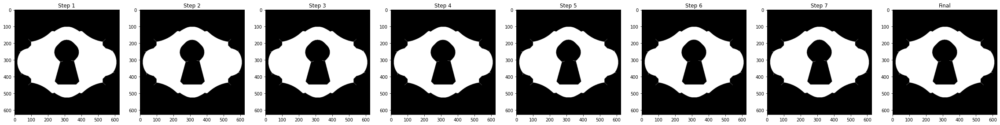

Pass number 19


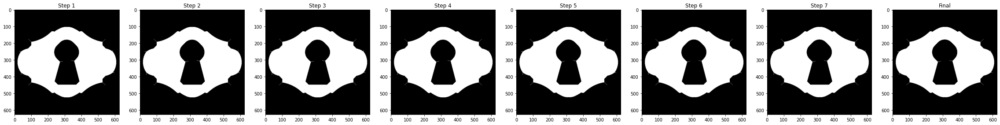

Pass number 20


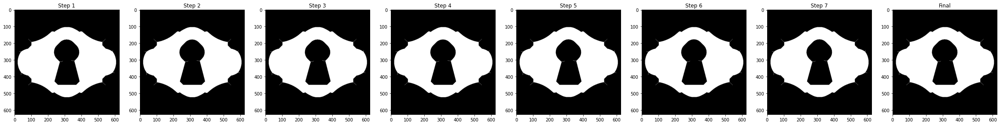

Pass number 21


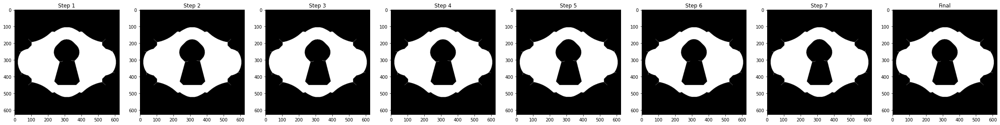

Pass number 22


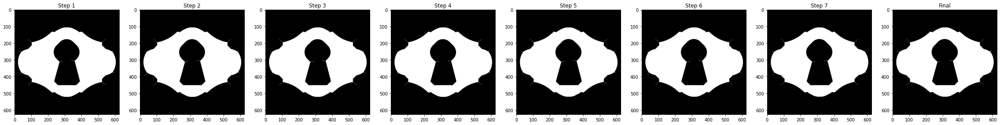

Pass number 23


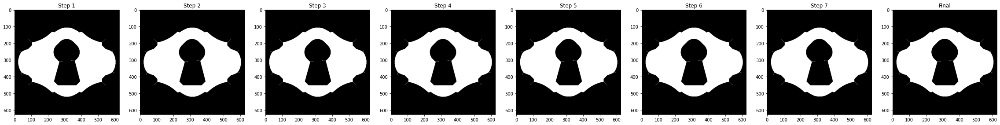

Pass number 24


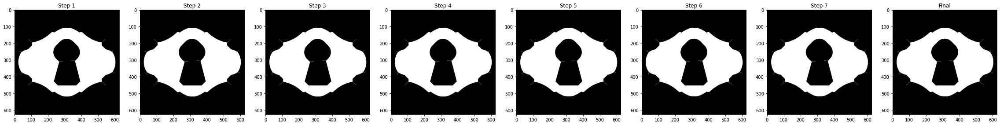

Pass number 25


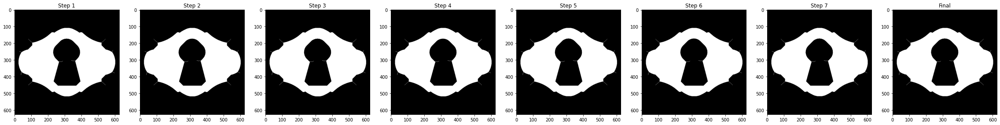

Pass number 26


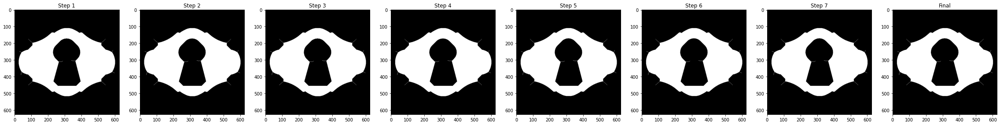

Pass number 27


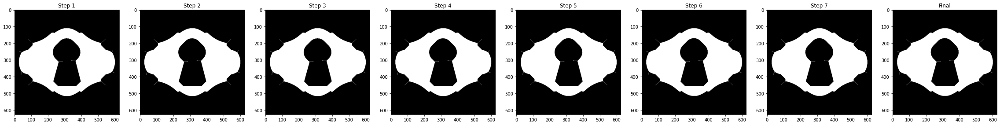

Pass number 28


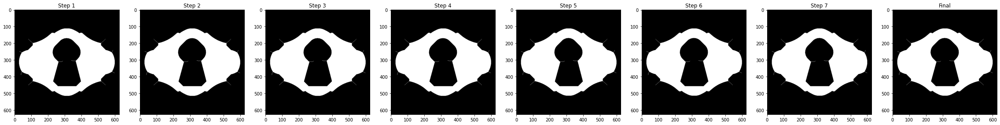

Pass number 29


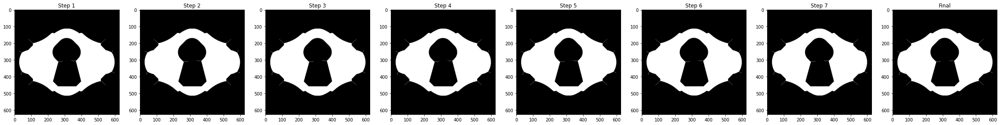

Pass number 30


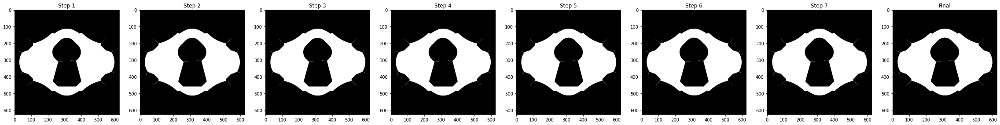

Pass number 31


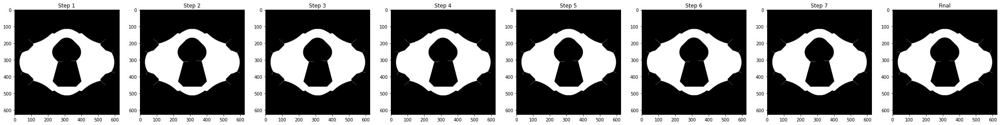

Pass number 32


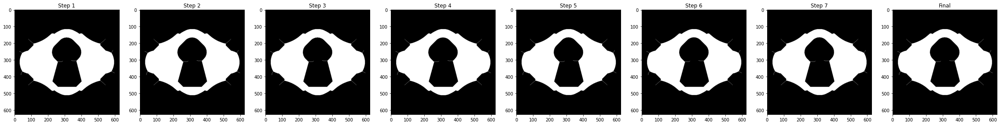

Pass number 33


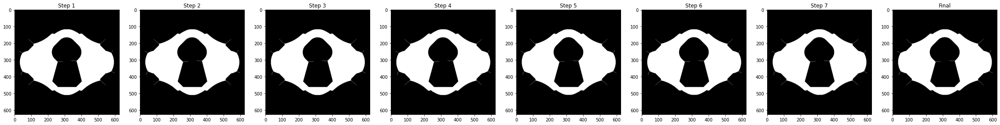

Pass number 34


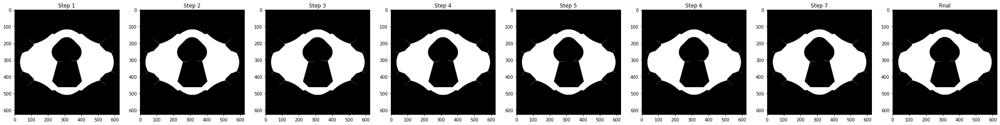

Pass number 35


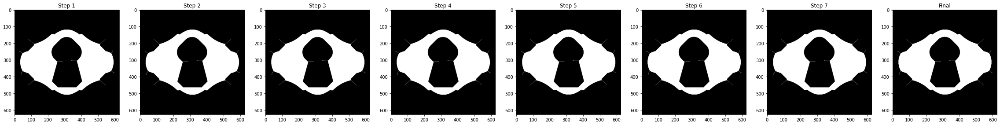

Pass number 36


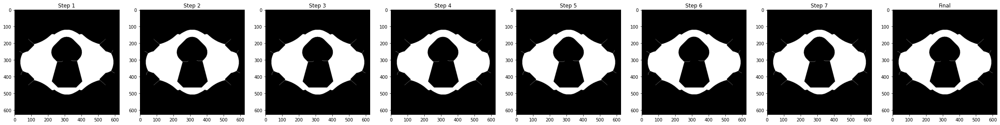

Pass number 37


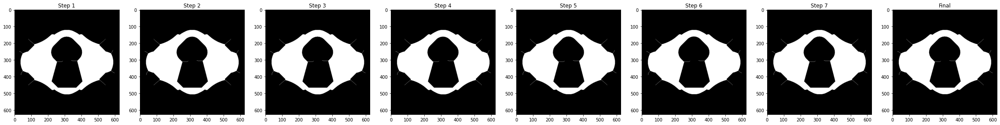

Pass number 38


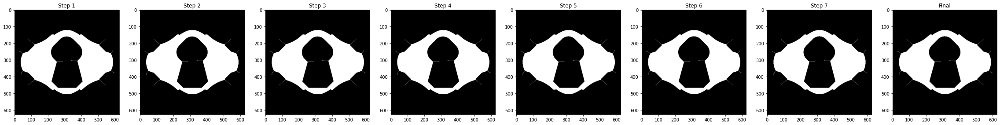

Pass number 39


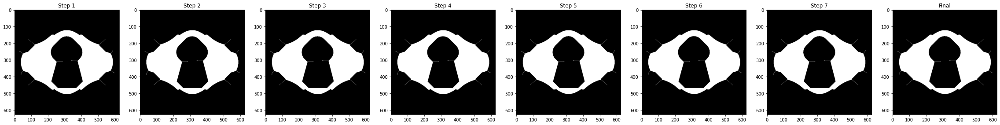

Pass number 40


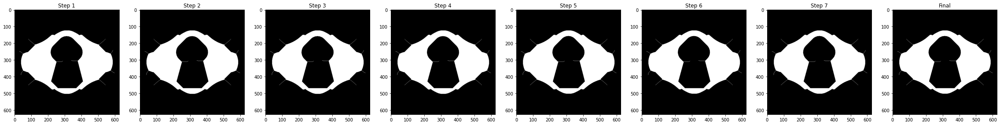

Pass number 41


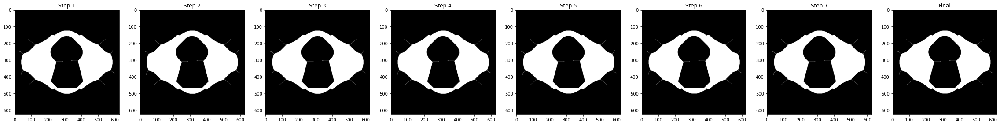

Pass number 42


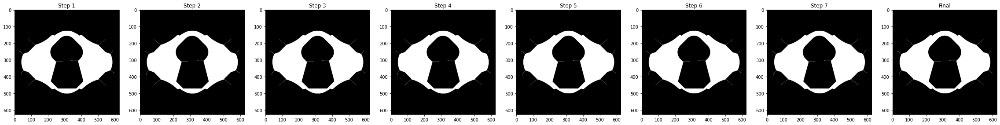

Pass number 43


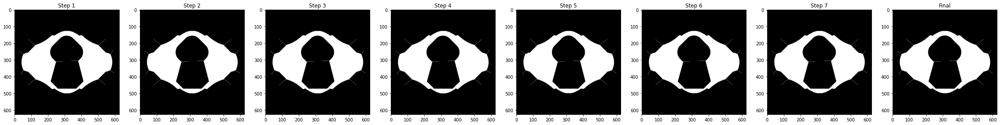

Pass number 44


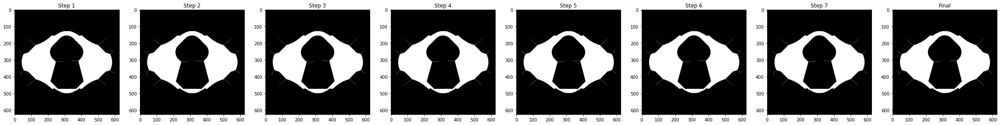

Pass number 45


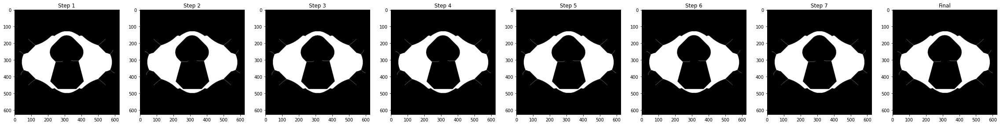

Pass number 46


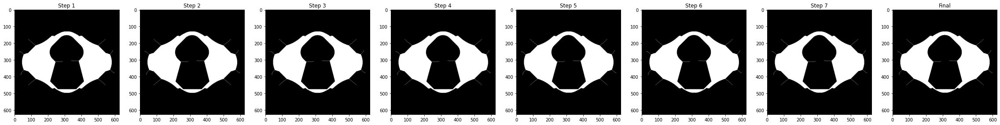

Pass number 47


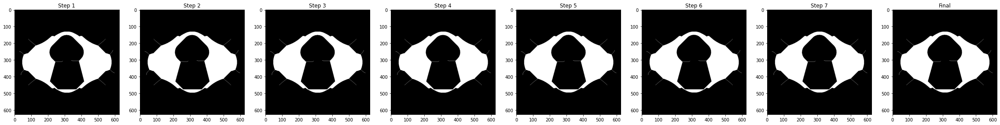

Pass number 48


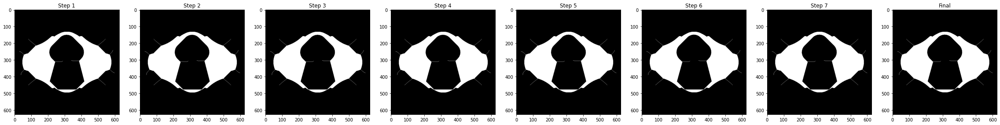

Pass number 49


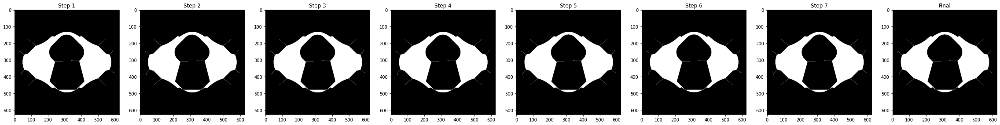

Pass number 50


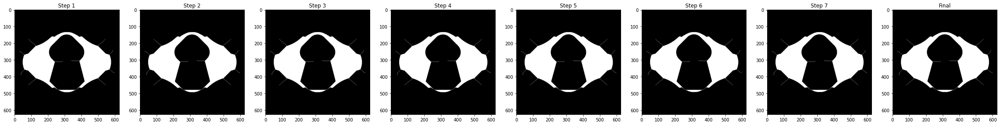

Pass number 51


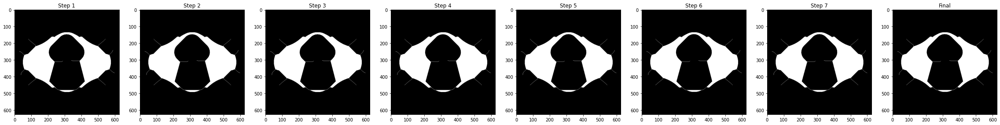

Pass number 52


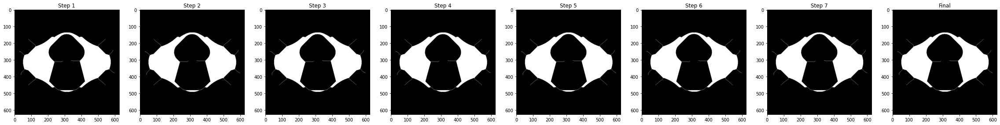

Pass number 53


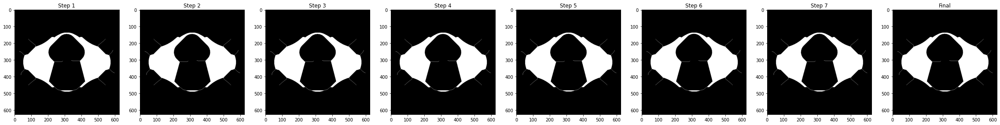

Pass number 54


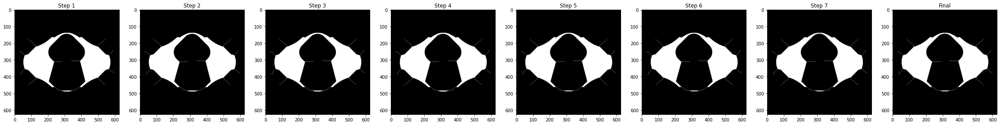

Pass number 55


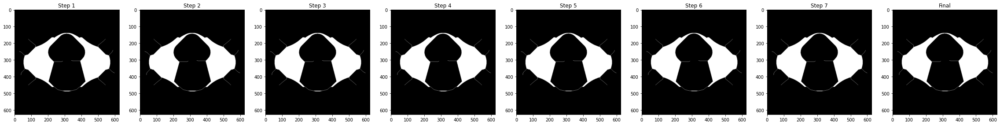

Pass number 56


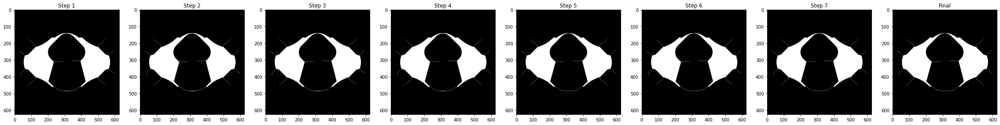

Pass number 57


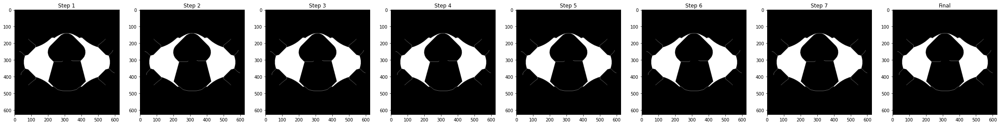

Pass number 58


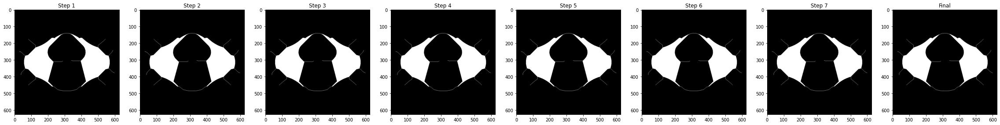

Pass number 59


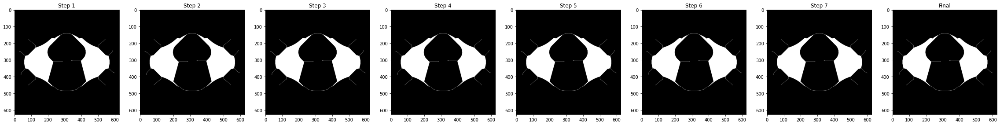

Pass number 60


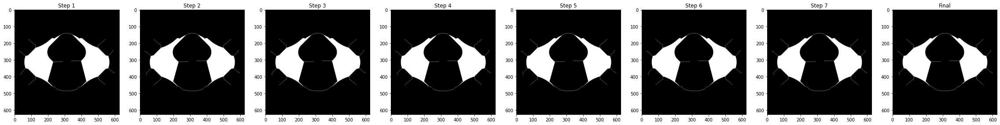

Pass number 61


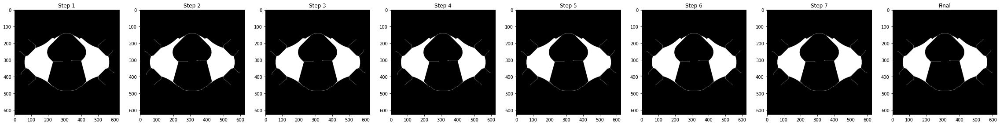

Pass number 62


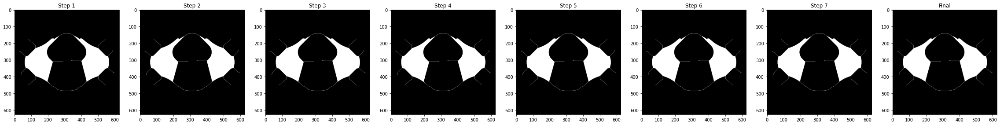

Pass number 63


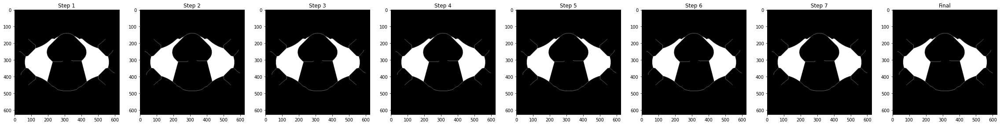

Pass number 64


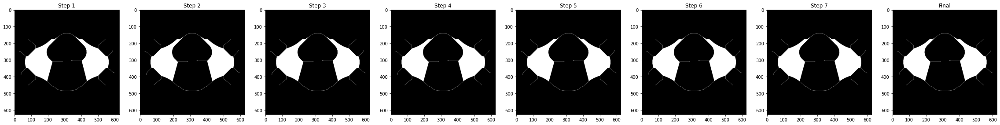

Pass number 65


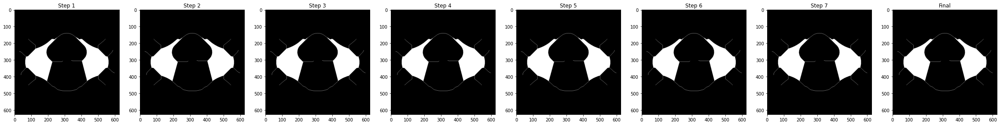

Pass number 66


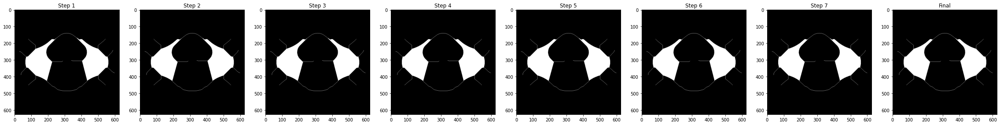

Pass number 67


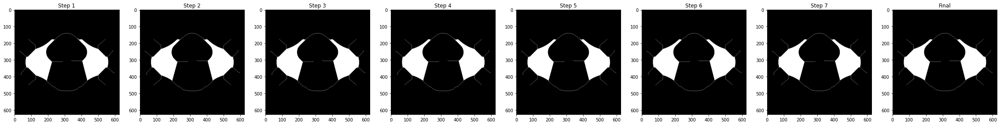

Pass number 68


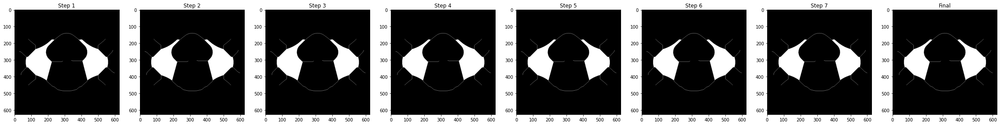

Pass number 69


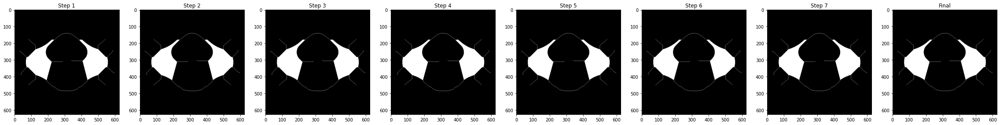

Pass number 70


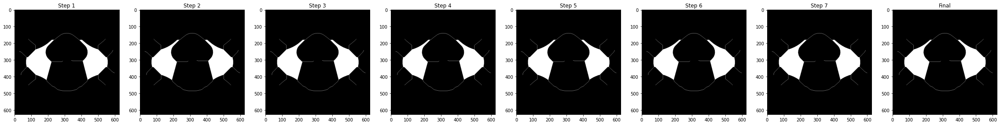

Pass number 71


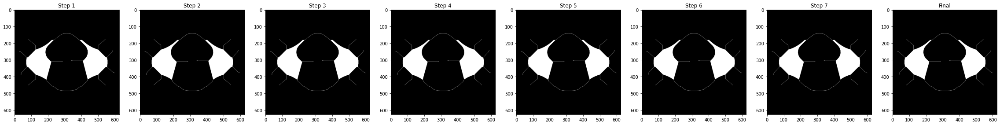

Pass number 72


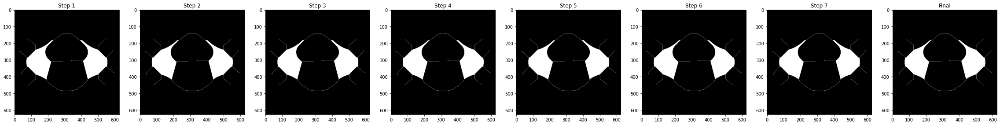

Pass number 73


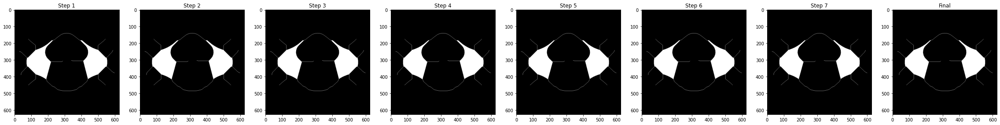

Pass number 74


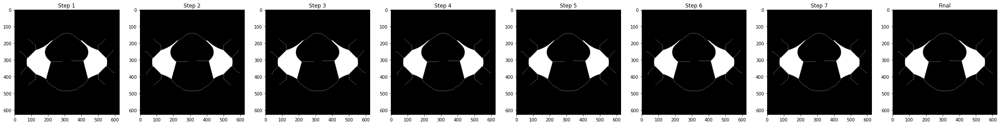

Pass number 75


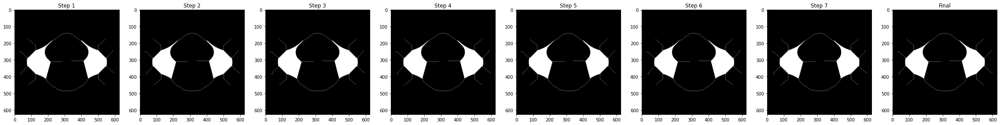

Pass number 76


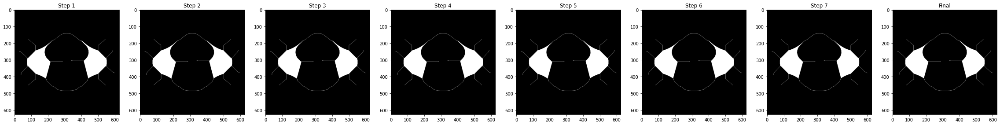

Pass number 77


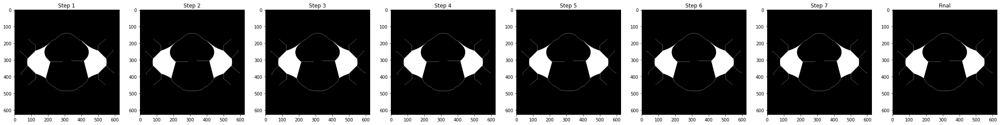

Pass number 78


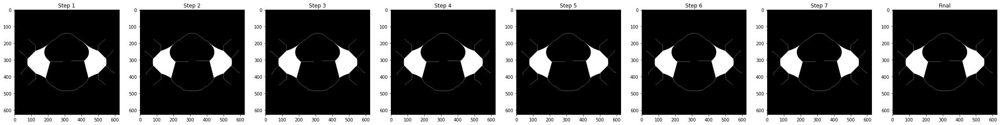

Pass number 79


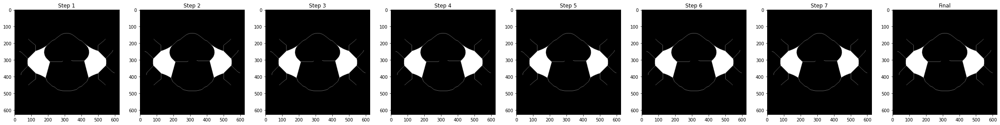

Pass number 80


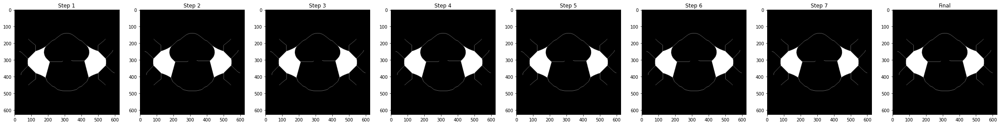

Pass number 81


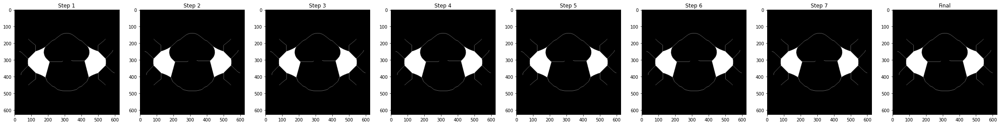

Pass number 82


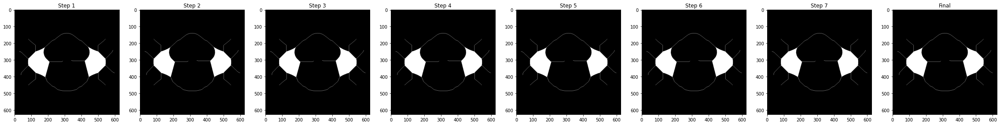

Pass number 83


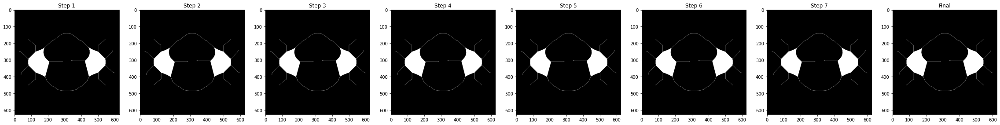

Pass number 84


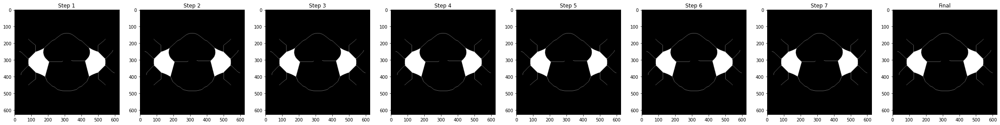

Pass number 85


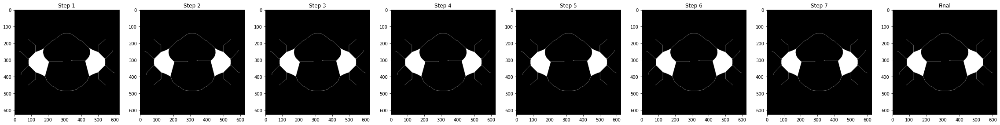

Pass number 86


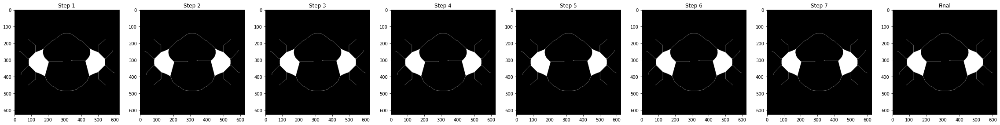

Pass number 87


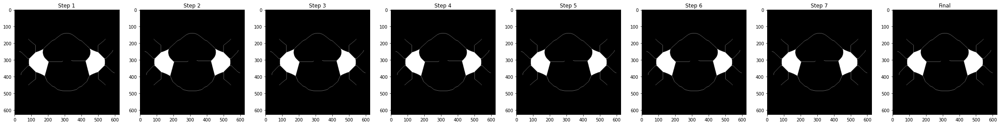

Pass number 88


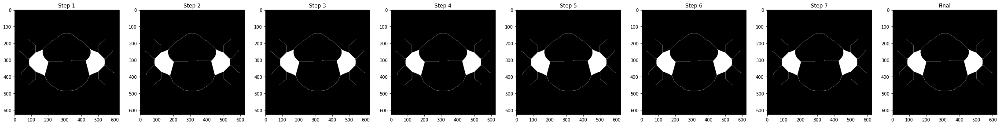

Pass number 89


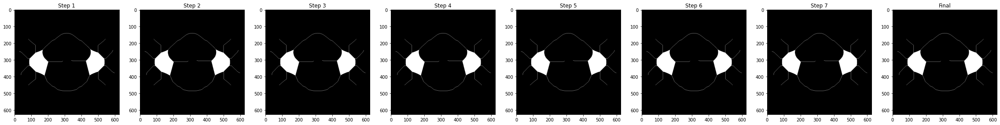

Pass number 90


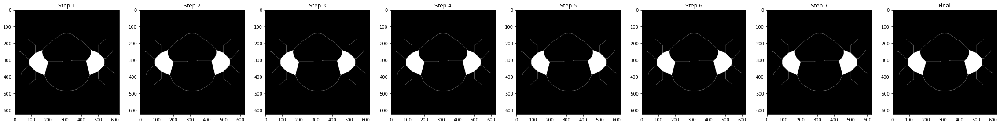

Pass number 91


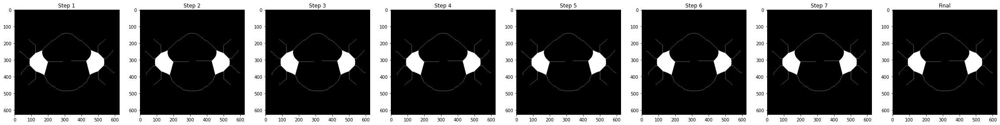

Pass number 92


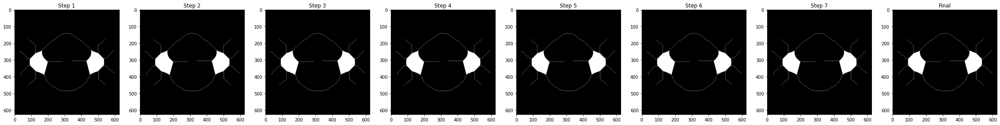

Pass number 93


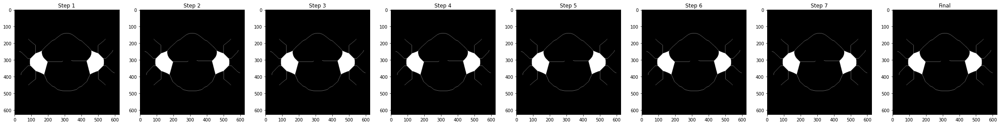

Pass number 94


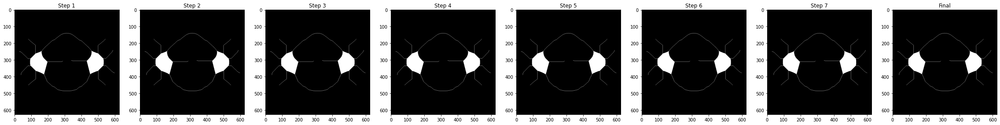

Pass number 95


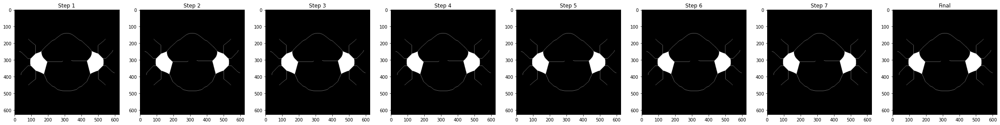

Pass number 96


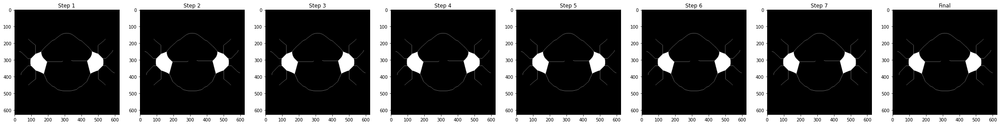

Pass number 97


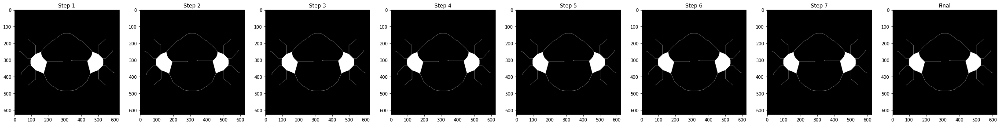

Pass number 98


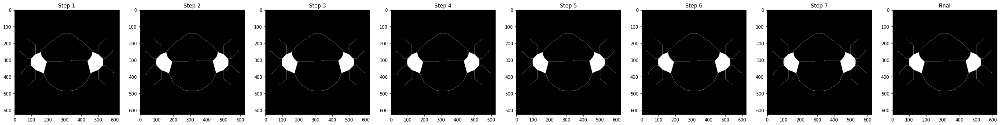

Pass number 99


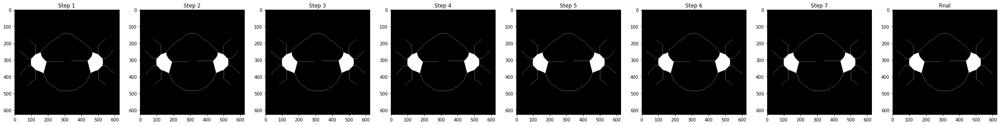

Pass number 100


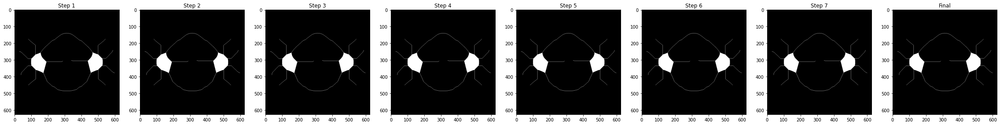

Pass number 101


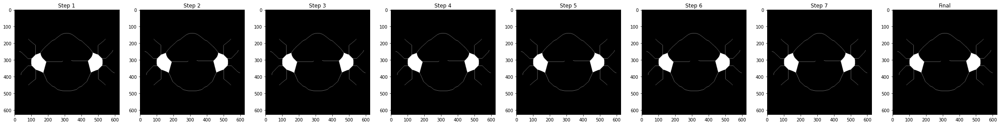

Pass number 102


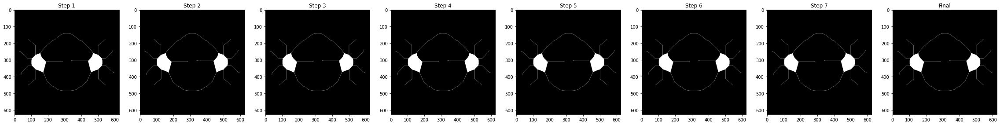

Pass number 103


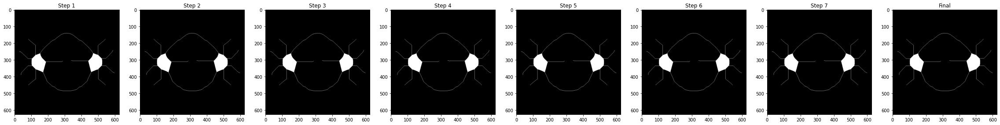

Pass number 104


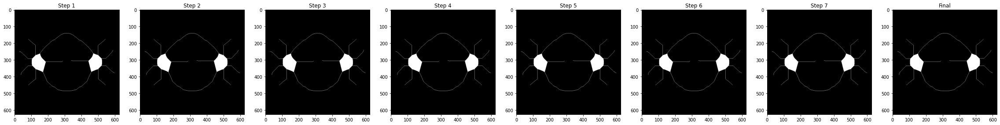

Pass number 105


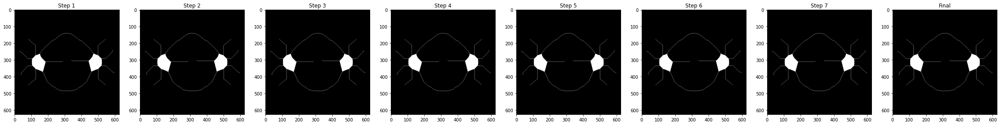

Pass number 106


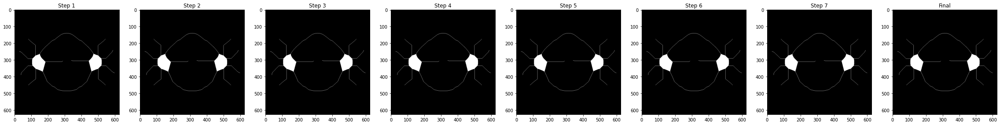

Pass number 107


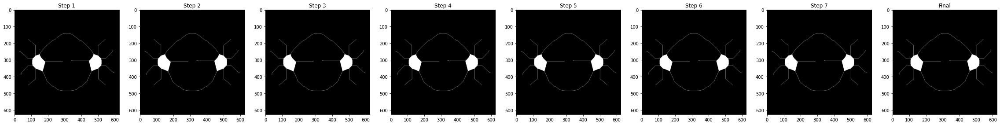

Pass number 108


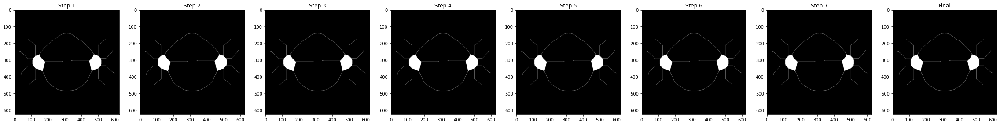

Pass number 109


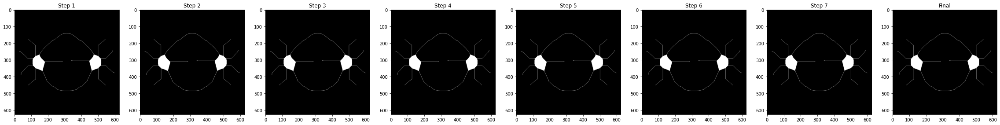

Pass number 110


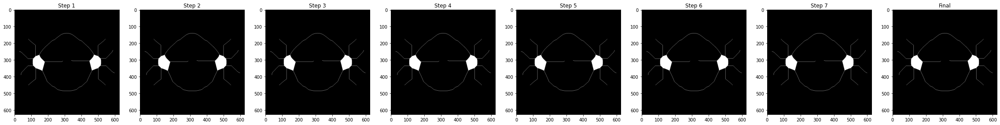

Pass number 111


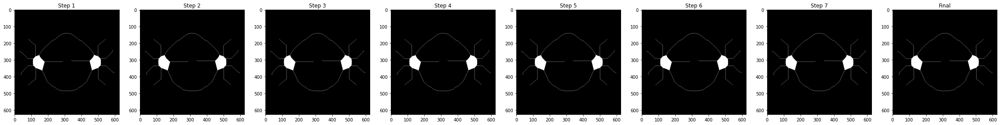

Pass number 112


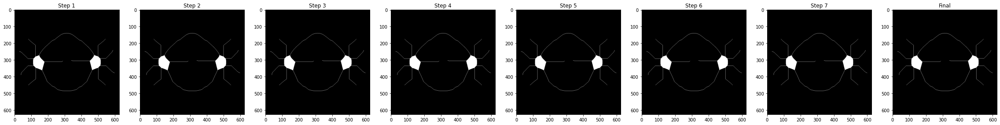

Pass number 113


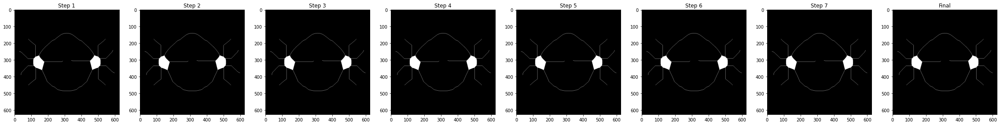

Pass number 114


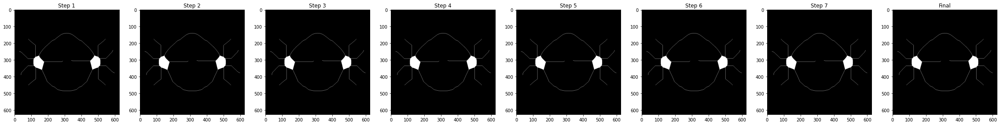

Pass number 115


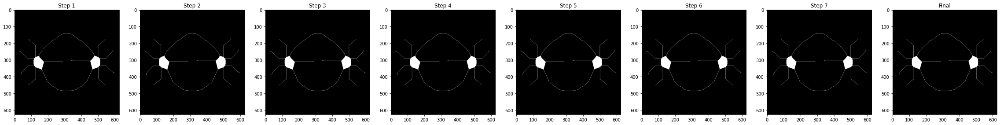

Pass number 116


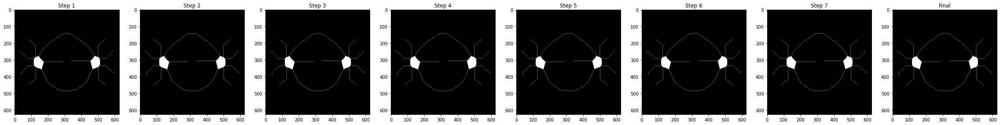

Pass number 117


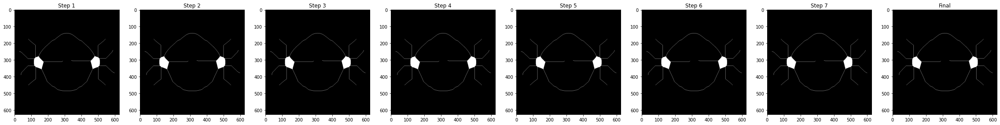

Pass number 118


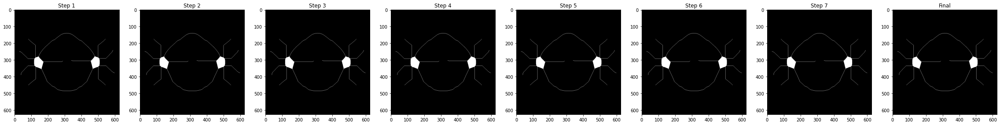

Pass number 119


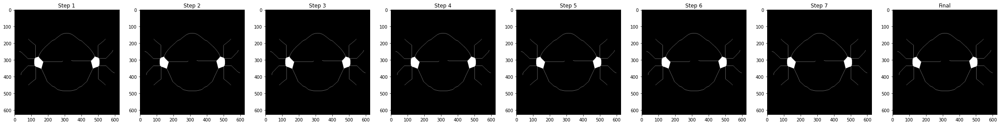

Pass number 120


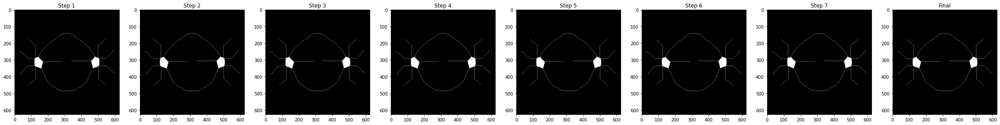

Pass number 121


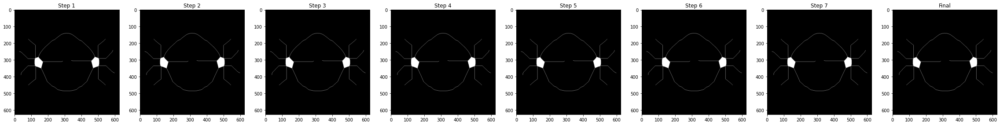

Pass number 122


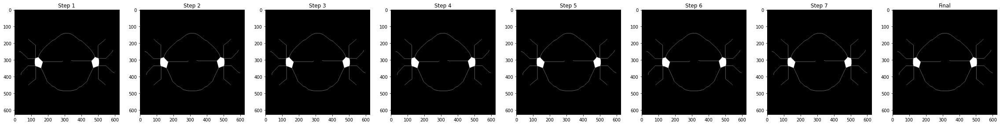

Pass number 123


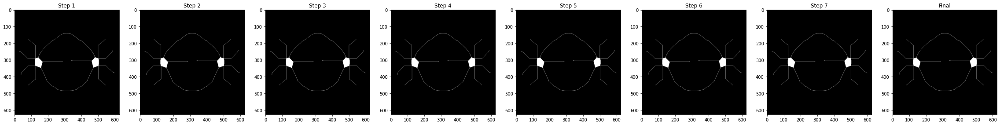

Pass number 124


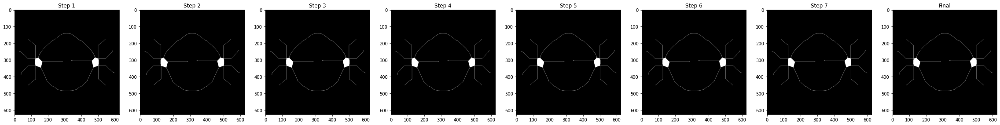

Pass number 125


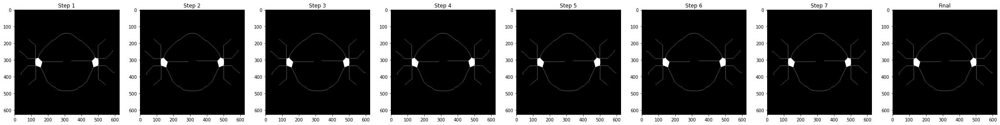

Pass number 126


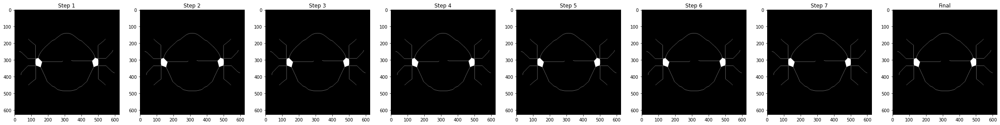

Pass number 127


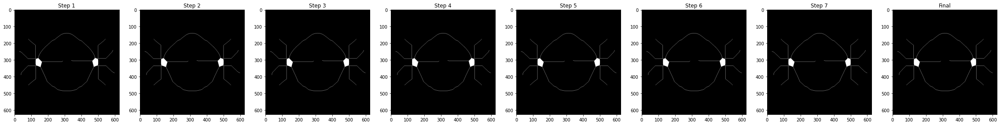

Pass number 128


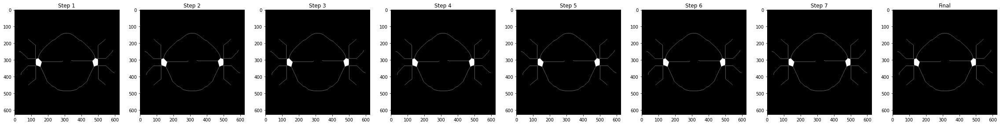

Pass number 129


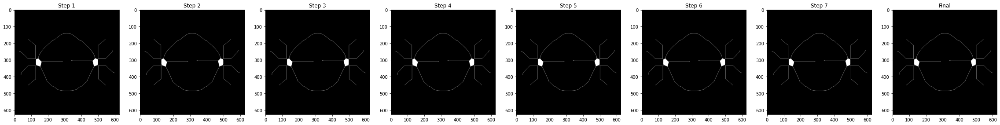

Pass number 130


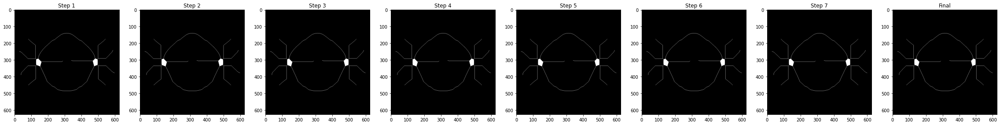

Pass number 131


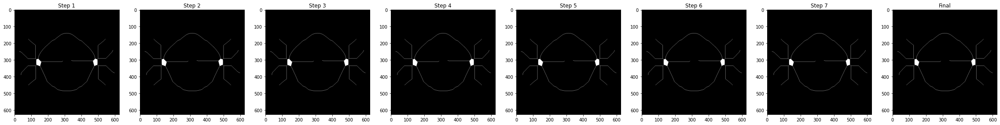

Pass number 132


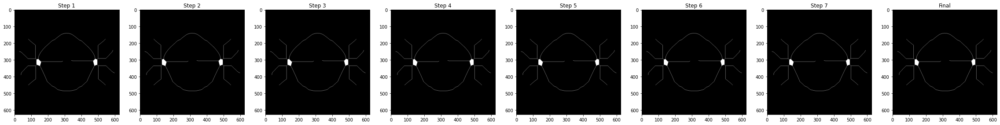

Pass number 133


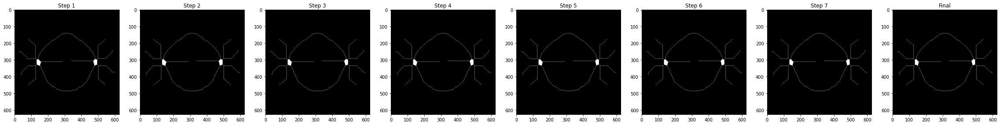

Pass number 134


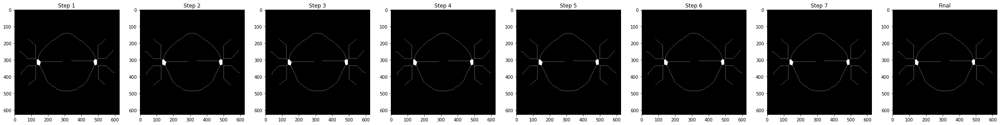

Pass number 135


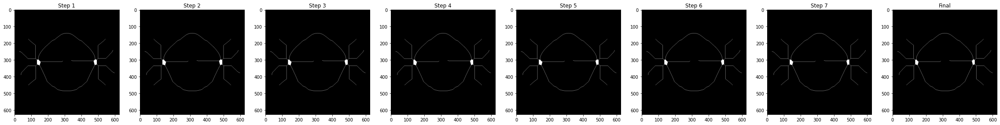

Pass number 136


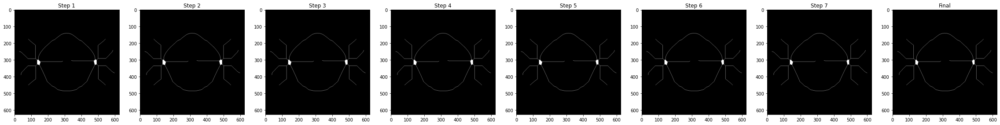

Pass number 137


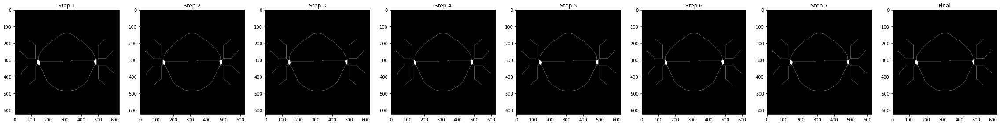

Pass number 138


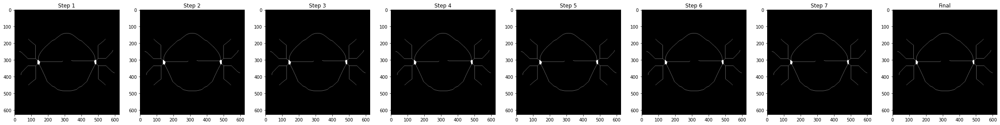

Pass number 139


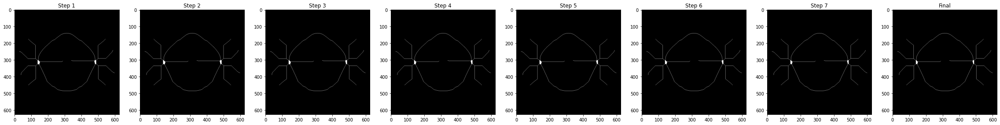

Pass number 140


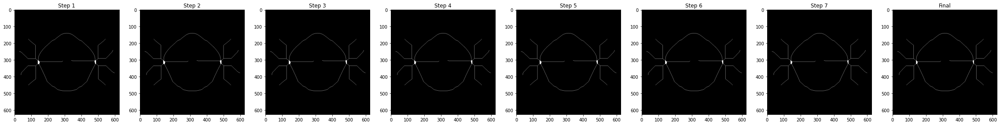

Pass number 141


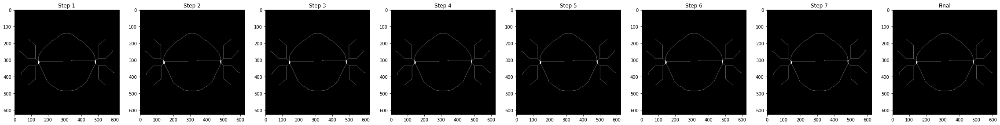

Pass number 142


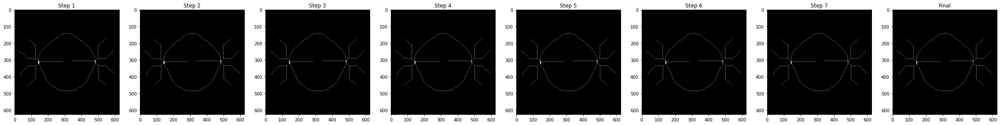

Pass number 143


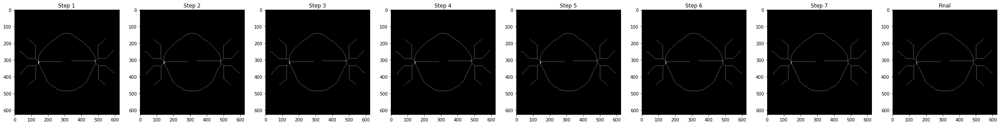

Pass number 144


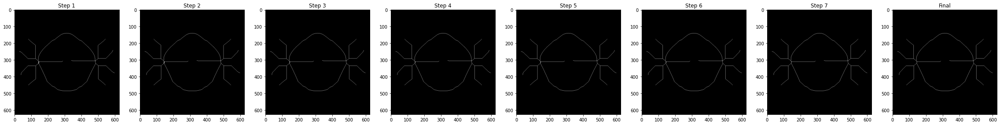

Pass number 145


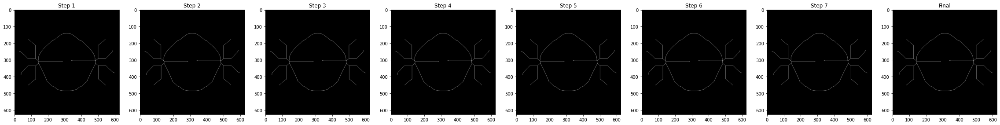

Pass number 146


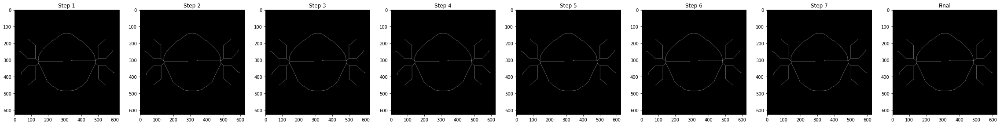

In [209]:
img = cv2.imread("../images/keyhole.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, img = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)
skeletonize(img)

In [4]:
def union_find_king(x,x_arr):
    final = 0
    if x_arr[x] == x:
        final = x
    else:
        x_arr[x] = union_find_king(x_arr[x],x_arr)
        final = x_arr[x]
    return final

# 2

In [5]:
def connected_components(img_opened):

    img_opened = img_opened//255
    img_zero = np.zeros_like(img_opened)
    img_zero = img_zero.astype(np.uint64)
    m,n = img_opened.shape


    left = 0
    diag = 0
    top = 0
    ID = 1

    hash_array = [0]
    for i in range(m):
        for j in range(n):
            left = 0
            diag = 0
            top = 0
            diag_right = 0
            if(img_opened[i,j]==1):

                if i-1>=0 and j>=0:
                    if img_opened[i-1,j] == 1:
                        left = img_zero[i-1,j]

                if i-1>=0 and j-1>=0:
                    if img_opened[i-1,j-1] == 1:
                        diag = img_zero[i-1,j-1]

                if i-1>=0 and j+1<n:
                    if img_opened[i-1,j+1] == 1:
                        diag_right = img_zero[i-1,j+1]

                if i>=0 and j-1>=0:
                    if img_opened[i,j-1] == 1:

                        top = img_zero[i,j-1]

                arr = [left,diag,diag_right,top]
                arr = np.array(arr).astype(np.uint64)
                arr = np.delete(arr, np.where(arr == 0))

                if arr.size == 0:
                    img_zero[i,j] = ID
                    hash_array.append(ID)
                    ID+=1

                elif arr.size == 1:
                    img_zero[i,j] = arr[0]

                elif arr.size == 2:
                    arr_sort = np.sort(arr)
                    minnie = arr_sort[0]
                    maxie = arr_sort[1]
                    
                    maxie_king = union_find_king(maxie,hash_array)
                    minnie_king = union_find_king(minnie,hash_array)
                    
                    arr_king = [maxie_king,minnie_king]
                    arr_king = np.array(arr_king).astype(np.uint64)
                    arr_king = np.sort(arr_king)
                    
                    hash_array[maxie_king] =arr_king[0]
                    hash_array[minnie_king] =arr_king[0]
                    
                    img_zero[i,j] = arr_sort[0]

                elif arr.size == 3:
                    arr_sort = np.sort(arr)

                    minnie = arr_sort[0]
                    med = arr_sort[1]
                    maxie = arr_sort[2]

                    maxie_king = union_find_king(maxie,hash_array)
                    minnie_king = union_find_king(minnie,hash_array)
                    med_king = union_find_king(med,hash_array)

                    arr_king = [maxie_king,minnie_king,med_king]
                    arr_king = np.array(arr_king).astype(np.uint64)
                    arr_king = np.sort(arr_king)
                    
                    hash_array[maxie_king] =arr_king[0]
                    hash_array[minnie_king] =arr_king[0]
                    hash_array[med_king] =arr_king[0]
                    
                    img_zero[i,j] = arr_sort[0]

                elif arr.size == 4:
                    arr_sort = np.sort(arr)

                    minnie = arr_sort[0]
                    med = arr_sort[1]
                    med1 = arr_sort[2]
                    maxie = arr_sort[3]

                    maxie_king = union_find_king(maxie,hash_array)
                    minnie_king = union_find_king(minnie,hash_array)
                    med_king = union_find_king(med,hash_array)
                    med1_king = union_find_king(med1,hash_array)

                    arr_king = [maxie_king,minnie_king,med_king,med1_king]
                    arr_king = np.array(arr_king).astype(np.uint64)
                    arr_king = np.sort(arr_king)
                    
                    hash_array[maxie_king] =arr_king[0]
                    hash_array[minnie_king] =arr_king[0]
                    hash_array[med_king] =arr_king[0]
                    hash_array[med1_king] =arr_king[0]
                    
                    img_zero[i,j] = arr_sort[0]
#     print(hash_array)
    
    uq = set()
    for i in range(1, len(hash_array)):
#         print(i,hash_array[i])
        hash_array[i] = union_find_king(hash_array[i], hash_array)
        uq.add(hash_array[i])
#     print("Number of connected components is", len(uq))
    
    img_zero = img_zero.astype(np.uint64)
    
    for i in range(0, m):
        for j in range(0, n):
            if img_zero[i,j] != 0:
#                     print(img_zero[i,j])
                    img_zero[i,j] = hash_array[img_zero[i,j]]
#                     print(img_zero[i,j])
    
    
    max_element = max(uq)
#     print(max_element)
    hashie = np.zeros((int(max_element)+1,3), dtype=np.uint64)
    hashie_num = np.zeros((int(max_element)+1,1), dtype=np.uint64)
#     print(hashie.shape)
#     print(uq)

    colors = []
    
#     print(hashie_num.shape)
    id_num = 1
    for i in uq:
        hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])
        if hashie_num[i,0] == 0:
            hashie_num[i,0] = id_num
            id_num+=1

    red = np.zeros((m,n))
    blue = np.zeros((m,n))
    green = np.zeros((m,n))


    img_zero = img_zero.astype(np.uint64)

    hash_array = np.array(hash_array)
    hash_array=hash_array.astype(np.uint64)

    for i in range(0, m):
        for j in range(0, n):
            if img_zero[i,j] != 0:
                ind = img_zero[i,j]
#                 print(img_zero[i,j])
                red[i][j] = hashie[ind][0]
                blue[i][j] = hashie[ind][1]
                green[i][j] = hashie[ind][2]
    
    for i in range(0, m):
        for j in range(0, n):
            if img_zero[i,j] != 0:
                img_zero[i,j] = hashie_num[img_zero[i,j]]
    final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
#     print(np.amax(img_zero))
    return final,img_zero,len(uq)

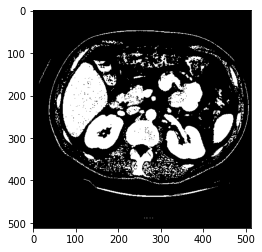

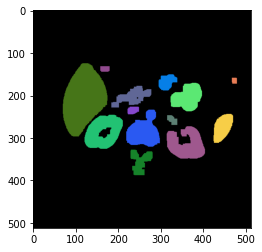

In [211]:
img = cv2.imread('../images/kidney.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(img, 130, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
img_closed = closing(thresh,3,0)
img_opened = opening(img_closed,11,0)

colored, comp,num_lables = connected_components(img_opened)
show_img(colored,1)

In [ ]:
img_eroded = erosion(thresh,5,0)
img_dilated = dilation(thresh,5,0)

kernel = np.ones((5, 5)) 
img_erosion = cv2.erode(thresh, kernel) 
img_dilation = cv2.dilate(thresh, kernel)

show_img(thresh,0)
images = [img_eroded,img_erosion]
strie = ['My erosion function', 'CV erosion function']
plottie_1d(2,images,strie)

images = [img_dilated,img_dilation]
strie = ['My dilation function', 'CV dilation function']
plottie_1d(2,images,strie)

print("Is my erosion function the same as CV2?",(img_eroded == img_erosion).all())
print("Is my dilation function the same as CV2?",(img_dilated == img_dilation).all())

# 3

In [307]:
img = cv2.imread('../images/coins.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(img, 130, 255, cv2.THRESH_BINARY)

colored, comp,num_components = connected_components(thresh)
# show_img(colored,1)
# show_img(comp,0)
comp_copy = comp.copy()
# print(count)

129


## 3a

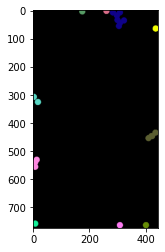

The number of coins touching the boundary is:
10


In [311]:
# print(int(np.amax(comp)))
m,n = comp_copy.shape

hash_coins = np.zeros((int(np.amax(comp_copy))+1,1), dtype=np.uint64)

# print(hash_coins)
for j in range(n):  # Iterating through the first row
    if comp_copy[0,j]!=0:
        hash_coins[comp_copy[0,j]] = 1
        
for j in range(n):  # Iterating through the last row
    if comp_copy[m-1,j]!=0:
        hash_coins[comp_copy[m-1,j]] = 1
        
for i in range(m):  # Iterating through the first column
    if comp_copy[i,0]!=0:
        hash_coins[comp_copy[i,0]] = 1
        
for i in range(m):  # Iterating through the last column
    if comp_copy[i,n-1]!=0:
        hash_coins[comp_copy[i,n-1]] = 1
      
for i in range(hash_coins.size):
    if hash_coins[i] ==0:
        count= count - 1
#         print(count)
        mask = (comp_copy==i) 

        comp_copy[mask==1] = 0

# print(hash_coins)
hasher = np.zeros((int(np.amax(comp_copy))+1,3), dtype=np.uint64)  
maxie = np.amax(comp_copy)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

for i in range(0, m):
    for j in range(0, n):
        if comp_copy[i,j] != 0:

            ind = comp_copy[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
show_img(final,1)
print("The number of coins touching the boundary is:")
print(np.where(hash_coins==1)[0].size)

# 3b

59


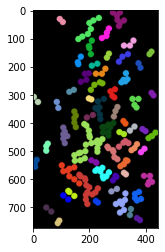

59


In [302]:
comp_copy2 = comp.copy()
m,n = comp_copy2.shape
# for i in range(m):
#     for j in range(n):
unique, counts = np.unique(comp_copy2, return_counts=True)
uniqies = dict(zip(unique, counts))
uniqies.pop(0, None)
# print(uniqies)
hash_coins2 = np.zeros((int(np.amax(comp_copy2))+1,1), dtype=np.uint64)
countie = 0
for comp_no in uniqies:
    
    if uniqies[comp_no]>500:
        countie+=1
        hash_coins2[comp_no]=1
# print(countie)        
for i in range(hash_coins2.size):
    if hash_coins2[i] ==0:
        mask = (comp_copy2==i) 

        comp_copy2[mask==1] = 0

# print(hash_coins)
hasher = np.zeros((int(np.amax(comp_copy2))+1,3), dtype=np.uint64)  
maxie = np.amax(comp_copy2)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if comp_copy2[i,j] != 0:

            ind = comp_copy2[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
show_img(final,1)
print(countie)

# 3c

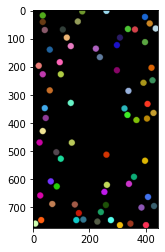

70


In [303]:
comp_copy2 = comp.copy()
m,n = comp_copy2.shape
# for i in range(m):
#     for j in range(n):
unique, counts = np.unique(comp_copy2, return_counts=True)
uniqies = dict(zip(unique, counts))
uniqies = dict(zip(unique, counts))
# print(uniqies)
hash_coins2 = np.zeros((int(np.amax(comp_copy2))+1,1), dtype=np.uint64)
countie = 0
for comp_no in uniqies: 
    if uniqies[comp_no]<=500:
        countie+=1
        hash_coins2[comp_no]=1
        
for i in range(hash_coins2.size):
    if hash_coins2[i] ==0:
        mask = (comp_copy2==i) 

        comp_copy2[mask==1] = 0

# print(hash_coins)
hasher = np.zeros((int(np.amax(comp_copy2))+1,3), dtype=np.uint64)  
maxie = np.amax(comp_copy2)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if comp_copy2[i,j] != 0:

            ind = comp_copy2[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
show_img(final,1)
print(countie)

## 5a

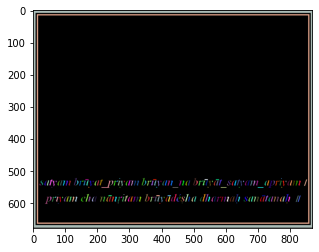

The number of components for the above color:  [0, 0, 0]
243


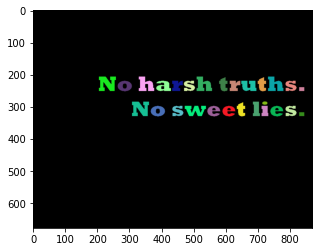

The number of components for the above color:  [31, 73, 125]
27


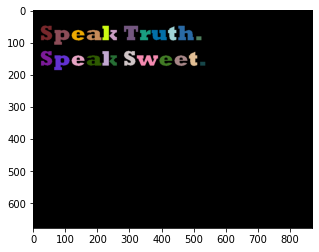

The number of components for the above color:  [255, 0, 0]
24


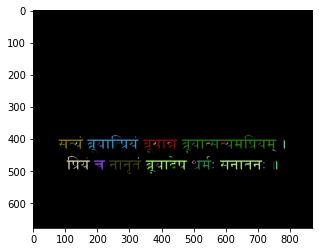

The number of components for the above color:  [0, 176, 80]
74


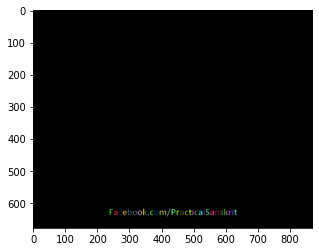

The number of components for the above color:  [112, 48, 160]
34


In [11]:
img = cv2.imread('../images/colourful_text.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

m,n,_ = img.shape
s = {}
for i in range(m):
    for j in range(n):
        tupie = (tuple(img[i,j]))
        if tupie in s:
            s[tupie] += 1
        else:
            s[tupie] = 1

# print(len(s))
s = {k: v for k, v in sorted(s.items(), key=lambda item: item[1], reverse=True)}
colie = 255
# print(s)
for color in s:
    if color[0] == 255 and color[1] ==255 and color[2]==255:
        continue
    if s[color] >=2358  and s[color]<=44590:
#         show_img(img,1)
        
        img_copy = np.zeros_like(img[:,:,0])
#         show_img(img_copy,1)
        
#         print(color, s[color])
        
        mask = (img==list(color))
#         print(np.allclose(mask[:,:,0],mask[:,:,1]))
        mask1 = mask[:,:,0]
        mask2 = mask[:,:,1]
        mask3 = mask[:,:,2]
        mask = mask1 & mask2 & mask3
        
        img_copy[mask==1] = 255

        ret, thresh = cv2.threshold(img_copy, 130, 255, cv2.THRESH_BINARY)

        colored, comp,num_components = connected_components(thresh)
        show_img(colored,1)
        print("The number of components for the above color: ",list(color))
        print(num_components)

# show_img(img_copy,1)

## Q5 2nd part

# Telugu letters with one hole

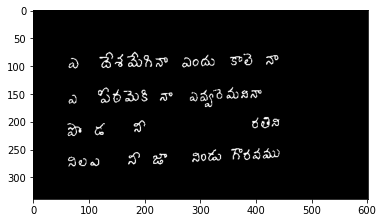

The number of telugu characters with one hole:
45


In [351]:
img = cv2.imread('../images/telugu.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                          cv2.THRESH_BINARY, 199, 50)
# show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(255-thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            if labels_inv[i+1,j]!=0:
#                 hashie[labels_inv[i+1,j]] = 1
                val = labels_inv[i+1,j]
                l.append([val,labels[i,j]])
                
            if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                val = labels_inv[i+1,j+1]
                l.append([val,labels[i,j]])
                
            if labels_inv[i,j+1]!=0:
#                 hashie[labels_inv[i,j+1]] = 1
                val = labels_inv[i,j+1]
                l.append([val,labels[i,j]])
                
            if labels_inv[i-1,j+1]!=0:
#                 hashie[labels_inv[i-1,j+1]] = 1
                val = labels_inv[i-1,j+1]
                l.append([val,labels[i,j]])
                
            if labels_inv[i-1,j]!=0:
#                 hashie[labels_inv[i-1,j]] = 1
                val = labels_inv[i-1,j]
                l.append([val,labels[i,j]])
                
            if labels_inv[i-1,j-1]!=0:
#                 hashie[labels_inv[i-1,j-1]] = 1
                val = labels_inv[i-1,j-1]
                l.append([val,labels[i,j]])
        
            if labels_inv[i,j-1]!=0:
#                 hashie[labels_inv[i,j-1]] = 1
                val = labels_inv[i,j-1]
                l.append([val,labels[i,j]])
        
            if labels_inv[i+1,j-1]!=0:
#                 hashie[labels_inv[i+1,j-1]] = 1
                val = labels_inv[i+1,j-1]
                l.append([val,labels[i,j]])
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] !=1:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of telugu characters with one hole:")
# print(hashie[0])
print(np.where(hashie==1)[0].size)

# Telugu letters with two holes

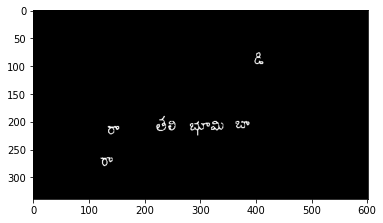

The number of telugu characters with two holes:
8


In [348]:
img = cv2.imread('../images/telugu.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, 
                                          cv2.THRESH_BINARY, 199, 50)
# show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(255-thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            if labels_inv[i+1,j]!=0:
#                 hashie[labels_inv[i+1,j]] = 1
                val = labels_inv[i+1,j]
                l.append([val,labels[i,j]])
                
            if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                val = labels_inv[i+1,j+1]
                l.append([val,labels[i,j]])
                
            if labels_inv[i,j+1]!=0:
#                 hashie[labels_inv[i,j+1]] = 1
                val = labels_inv[i,j+1]
                l.append([val,labels[i,j]])
                
            if labels_inv[i-1,j+1]!=0:
#                 hashie[labels_inv[i-1,j+1]] = 1
                val = labels_inv[i-1,j+1]
                l.append([val,labels[i,j]])
                
            if labels_inv[i-1,j]!=0:
#                 hashie[labels_inv[i-1,j]] = 1
                val = labels_inv[i-1,j]
                l.append([val,labels[i,j]])
                
            if labels_inv[i-1,j-1]!=0:
#                 hashie[labels_inv[i-1,j-1]] = 1
                val = labels_inv[i-1,j-1]
                l.append([val,labels[i,j]])
        
            if labels_inv[i,j-1]!=0:
#                 hashie[labels_inv[i,j-1]] = 1
                val = labels_inv[i,j-1]
                l.append([val,labels[i,j]])
        
            if labels_inv[i+1,j-1]!=0:
#                 hashie[labels_inv[i+1,j-1]] = 1
                val = labels_inv[i+1,j-1]
                l.append([val,labels[i,j]])
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] !=2:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of telugu characters with two holes:")
print(np.where(hashie==2)[0].size)

# Tamil letters with one hole

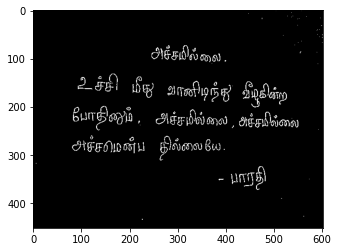

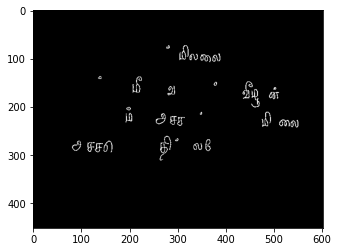

The number of Tamil characters with one hole:
30


In [359]:
img = cv2.imread('../images/tamil.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,6)
# thresh = closing(thresh,5,0)
show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(255-thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            try:
                if labels_inv[i+1,j]!=0 :
#                 hashie[labels_inv[i+1,j]] = 1
                    val = labels_inv[i+1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                    val = labels_inv[i+1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j+1]!=0:
    #                 hashie[labels_inv[i,j+1]] = 1
                    val = labels_inv[i,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j+1]!=0:
    #                 hashie[labels_inv[i-1,j+1]] = 1
                    val = labels_inv[i-1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j]!=0:
    #                 hashie[labels_inv[i-1,j]] = 1
                    val = labels_inv[i-1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j-1]!=0:
    #                 hashie[labels_inv[i-1,j-1]] = 1
                    val = labels_inv[i-1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j-1]!=0:
    #                 hashie[labels_inv[i,j-1]] = 1
                    val = labels_inv[i,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i+1,j-1]!=0:
    #                 hashie[labels_inv[i+1,j-1]] = 1
                    val = labels_inv[i+1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] !=1:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of Tamil characters with one hole:")
# print(hashie[0])
print(np.where(hashie==1)[0].size)

# Number of tamil characters with 2 holes

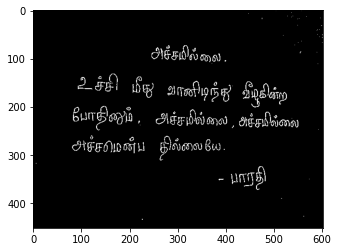

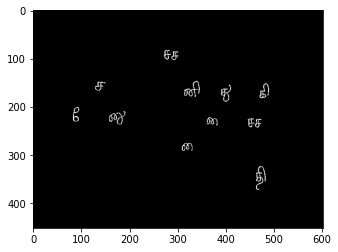

The number of Tamil characters with two holes:
13


In [12]:
img = cv2.imread('../images/tamil.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,6)
# thresh = closing(thresh,5,0)
show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(255-thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            try:
                if labels_inv[i+1,j]!=0 :
#                 hashie[labels_inv[i+1,j]] = 1
                    val = labels_inv[i+1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                    val = labels_inv[i+1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j+1]!=0:
    #                 hashie[labels_inv[i,j+1]] = 1
                    val = labels_inv[i,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j+1]!=0:
    #                 hashie[labels_inv[i-1,j+1]] = 1
                    val = labels_inv[i-1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j]!=0:
    #                 hashie[labels_inv[i-1,j]] = 1
                    val = labels_inv[i-1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j-1]!=0:
    #                 hashie[labels_inv[i-1,j-1]] = 1
                    val = labels_inv[i-1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j-1]!=0:
    #                 hashie[labels_inv[i,j-1]] = 1
                    val = labels_inv[i,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i+1,j-1]!=0:
    #                 hashie[labels_inv[i+1,j-1]] = 1
                    val = labels_inv[i+1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] !=2:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of Tamil characters with two holes:")
# print(hashie[0])
print(np.where(hashie==2)[0].size)

## Q4.1- Objects with one or more holes

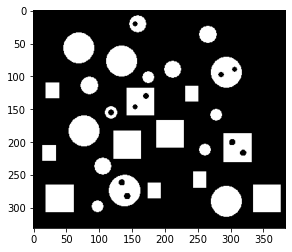

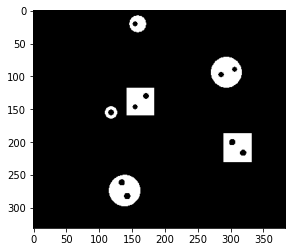

The number of objects with one or more holes:
6


In [386]:
image_square = cv2.imread('../images/objects.png')
image_square = cv2.cvtColor(image_square, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(image_square, 1, 255, cv2.THRESH_BINARY)

# image_square_gray = cv2.cvtColor(image_square, cv2.COLOR_BGR2GRAY)
# ret, thresh = cv2.threshold(image_square_gray, 1, 255, cv2.THRESH_BINARY)
# colors_square, labels_square,number_square = connected_components(thresh)
show_img(thresh,0)
# print("The number of circle objects are:")
# print(number_square)


# img = cv2.imread('../images/tamil.jpeg')
# img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,6)
# thresh = closing(thresh,5,0)
# show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(255-thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            try:
                if labels_inv[i+1,j]!=0 :
#                 hashie[labels_inv[i+1,j]] = 1
                    val = labels_inv[i+1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                    val = labels_inv[i+1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j+1]!=0:
    #                 hashie[labels_inv[i,j+1]] = 1
                    val = labels_inv[i,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j+1]!=0:
    #                 hashie[labels_inv[i-1,j+1]] = 1
                    val = labels_inv[i-1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j]!=0:
    #                 hashie[labels_inv[i-1,j]] = 1
                    val = labels_inv[i-1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j-1]!=0:
    #                 hashie[labels_inv[i-1,j-1]] = 1
                    val = labels_inv[i-1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j-1]!=0:
    #                 hashie[labels_inv[i,j-1]] = 1
                    val = labels_inv[i,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i+1,j-1]!=0:
    #                 hashie[labels_inv[i+1,j-1]] = 1
                    val = labels_inv[i+1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] ==0:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of objects with one or more holes:")
# print(hashie[0])
print(np.where(hashie!=0)[0].size)

# 4.2 The number of square objects

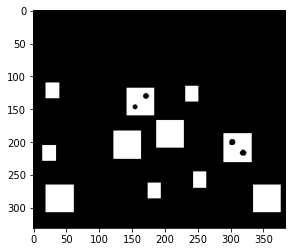

The number of square objects are:
11


In [381]:
def detect_shapes(thresh,typ):
    
    colors_all, labels_all,number_all = connected_components(thresh)
    
    img_erod = erosion(thresh,3,1)

    colors_square, labels_square,number_square = connected_components(img_erod)
    
#     print(number_square)

    hasher = np.zeros((int(np.amax(labels_all))+1,1), dtype=np.uint64)
    labels_all_copy = labels_all.copy()
#     print(np.amax(labels_all))
    m,n = labels_all.shape

    for i in range(m):
        for j in range(n):
            
             if labels_square[i,j]!=0 and labels_all[i,j]!=0:
                hasher[labels_all[i,j]] = 1


    for i in range(hasher.size):

        if typ == 0:
            if hasher[i] == 0:
                mask = (labels_all==i) 

                labels_all_copy[mask==1] = 0
        else:
            if hasher[i] != 0:
                mask = (labels_all==i) 

                labels_all_copy[mask==1] = 0

    hashie = np.zeros((int(np.amax(labels_all_copy))+1,3), dtype=np.uint64)  
    maxie = np.amax(labels_all_copy)

    for i in range(int(maxie)+1):
        hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 127), random.randint(0, 63)])

    red = np.zeros((m,n))
    blue = np.zeros((m,n))
    green = np.zeros((m,n))
    
    count = 0
    for i in range(0, m):
        for j in range(0, n):
            if labels_all_copy[i,j] != 0:
 
                ind = labels_all_copy[i,j]
                red[i][j] = hashie[ind][0]
                blue[i][j] = hashie[ind][1]
                green[i][j] = hashie[ind][2]

    final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
    if type == 0:
        number_square = number_square
    else:
        number_square = 27 - number_square
    return final,labels_all_copy,number_square

image_square = cv2.imread('../images/objects.png')
image_square = cv2.cvtColor(image_square, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(image_square, 1, 255, cv2.THRESH_BINARY)
image_square, labels_square, number_square = detect_shapes(thresh,0)

image_square_gray = cv2.cvtColor(image_square, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(image_square_gray, 1, 255, cv2.THRESH_BINARY)
colors_square, labels_square,number_square = connected_components(thresh)
show_img(thresh,0)
print("The number of square objects are:")
print(number_square)

# 4.3 The square objects with holes

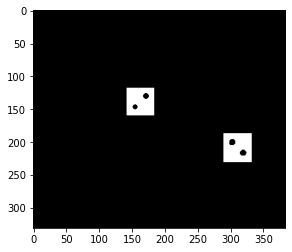

The number of squares with one hole:
2


In [382]:
# img = cv2.imread('../images/tamil.jpeg')
# img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,6)
# thresh = closing(thresh,5,0)
# show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(255-thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            try:
                if labels_inv[i+1,j]!=0 :
#                 hashie[labels_inv[i+1,j]] = 1
                    val = labels_inv[i+1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                    val = labels_inv[i+1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j+1]!=0:
    #                 hashie[labels_inv[i,j+1]] = 1
                    val = labels_inv[i,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j+1]!=0:
    #                 hashie[labels_inv[i-1,j+1]] = 1
                    val = labels_inv[i-1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j]!=0:
    #                 hashie[labels_inv[i-1,j]] = 1
                    val = labels_inv[i-1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j-1]!=0:
    #                 hashie[labels_inv[i-1,j-1]] = 1
                    val = labels_inv[i-1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j-1]!=0:
    #                 hashie[labels_inv[i,j-1]] = 1
                    val = labels_inv[i,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i+1,j-1]!=0:
    #                 hashie[labels_inv[i+1,j-1]] = 1
                    val = labels_inv[i+1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] ==0:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of squares with one hole:")
# print(hashie[0])
print(np.where(hashie!=0)[0].size)

# 4.4 The circle objects with no holes

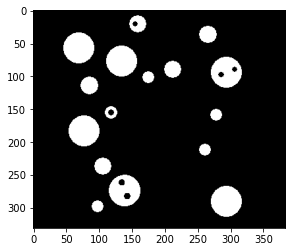

The number of circle objects are:
16


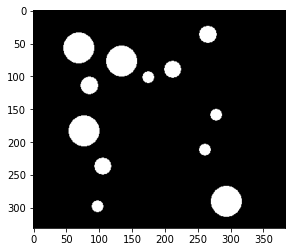

The number of circles with no holes:
12


In [383]:
def detect_shapes(thresh,typ):
    
    colors_all, labels_all,number_all = connected_components(thresh)
    
    img_erod = erosion(thresh,3,1)

    colors_square, labels_square,number_square = connected_components(img_erod)
    
#     print(number_square)

    hasher = np.zeros((int(np.amax(labels_all))+1,1), dtype=np.uint64)
    labels_all_copy = labels_all.copy()
#     print(np.amax(labels_all))
    m,n = labels_all.shape

    for i in range(m):
        for j in range(n):
            
             if labels_square[i,j]!=0 and labels_all[i,j]!=0:
                hasher[labels_all[i,j]] = 1


    for i in range(hasher.size):

        if typ == 0:
            if hasher[i] == 0:
                mask = (labels_all==i) 

                labels_all_copy[mask==1] = 0
        else:
            if hasher[i] != 0:
                mask = (labels_all==i) 

                labels_all_copy[mask==1] = 0

    hashie = np.zeros((int(np.amax(labels_all_copy))+1,3), dtype=np.uint64)  
    maxie = np.amax(labels_all_copy)

    for i in range(int(maxie)+1):
        hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 127), random.randint(0, 63)])

    red = np.zeros((m,n))
    blue = np.zeros((m,n))
    green = np.zeros((m,n))
    
    count = 0
    for i in range(0, m):
        for j in range(0, n):
            if labels_all_copy[i,j] != 0:
 
                ind = labels_all_copy[i,j]
                red[i][j] = hashie[ind][0]
                blue[i][j] = hashie[ind][1]
                green[i][j] = hashie[ind][2]

    final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
    if type == 0:
        number_square = number_square
    else:
        number_square = 27 - number_square
    return final,labels_all_copy,number_square

image_square = cv2.imread('../images/objects.png')
image_square = cv2.cvtColor(image_square, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(image_square, 1, 255, cv2.THRESH_BINARY)
image_square, labels_square, number_square = detect_shapes(thresh,1)

image_square_gray = cv2.cvtColor(image_square, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(image_square_gray, 1, 255, cv2.THRESH_BINARY)
colors_square, labels_square,number_square = connected_components(thresh)
show_img(thresh,0)
print("The number of circle objects are:")
print(number_square)


# img = cv2.imread('../images/tamil.jpeg')
# img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,11,6)
# thresh = closing(thresh,5,0)
# show_img(thresh,0)
# cv2.imwrite("./check.jpg",thresh)
color, labels, number = connected_components(255-thresh)
# print(labels[0,2],labels[0,3],labels[0,4])

mask = (labels==labels[0,3])

labels[mask==1] = 0

hashie = np.zeros((int(np.amax(labels))+1,3), dtype=np.uint64)  
maxie = np.amax(labels)

for i in range(maxie):
    hashie[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

m,n = img.shape
red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels[i,j] != 0:

            ind = labels[i,j]
            red[i][j] = hashie[ind][0]
            blue[i][j] = hashie[ind][1]
            green[i][j] = hashie[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 

# show_img(final,1)

# cv2.imwrite("./check1.jpg",final)

color_inv, labels_inv, number_inv = connected_components(thresh)
# show_img(color_inv,1)
# cv2.imwrite("./check.jpg",color_inv)

hashie = np.zeros((int(np.amax(labels_inv))+1,1), dtype=np.uint64) 
# print(int(np.amax(labels_inv))+1)
m,n = labels_inv.shape
# print(labels_inv.shape,labels.shape)
l = []
# print("HELLO")
for i in range(m):
    for j in range(n):
        if labels[i,j]!=0:
            try:
                if labels_inv[i+1,j]!=0 :
#                 hashie[labels_inv[i+1,j]] = 1
                    val = labels_inv[i+1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i+1,j+1]!=0:
#                 hashie[labels_inv[i+1,j+1]] = 1
                    val = labels_inv[i+1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j+1]!=0:
    #                 hashie[labels_inv[i,j+1]] = 1
                    val = labels_inv[i,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j+1]!=0:
    #                 hashie[labels_inv[i-1,j+1]] = 1
                    val = labels_inv[i-1,j+1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j]!=0:
    #                 hashie[labels_inv[i-1,j]] = 1
                    val = labels_inv[i-1,j]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i-1,j-1]!=0:
    #                 hashie[labels_inv[i-1,j-1]] = 1
                    val = labels_inv[i-1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            
            try:
                if labels_inv[i,j-1]!=0:
    #                 hashie[labels_inv[i,j-1]] = 1
                    val = labels_inv[i,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
            try:
                if labels_inv[i+1,j-1]!=0:
    #                 hashie[labels_inv[i+1,j-1]] = 1
                    val = labels_inv[i+1,j-1]
                    l.append([val,labels[i,j]])
            except:
                pass
# print("HELLO")
           
s=set(tuple(i) for i in l)


for i in s:
    hashie[i[0]]+=1 

for i in range(hashie.size):
    if hashie[i] !=0:
        mask = (labels_inv==i) 

        labels_inv[mask==1] = 0

hasher = np.zeros((int(np.amax(labels_inv))+1,3), dtype=np.uint64)  
maxie = np.amax(labels_inv)

for i in range(int(maxie)+1):
    hasher[i] = np.asarray([random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)])

red = np.zeros((m,n))
blue = np.zeros((m,n))
green = np.zeros((m,n))

count = 0
for i in range(0, m):
    for j in range(0, n):
        if labels_inv[i,j] != 0:

            ind = labels_inv[i,j]
            red[i][j] = hasher[ind][0]
            blue[i][j] = hasher[ind][1]
            green[i][j] = hasher[ind][2]

final = np.stack([red, green, blue], axis=2).astype(np.uint8) 
final = cv2.cvtColor(final, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(final, 1, 255, cv2.THRESH_BINARY)
show_img(thresh,0)
print("The number of circles with no holes:")
# print(hashie[0])
print(np.where(hashie==0)[0].size -1)

## Q7

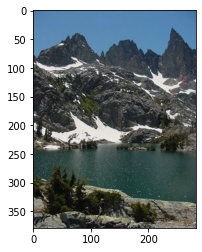

Rotating the given image while retaining the original image's dimensions


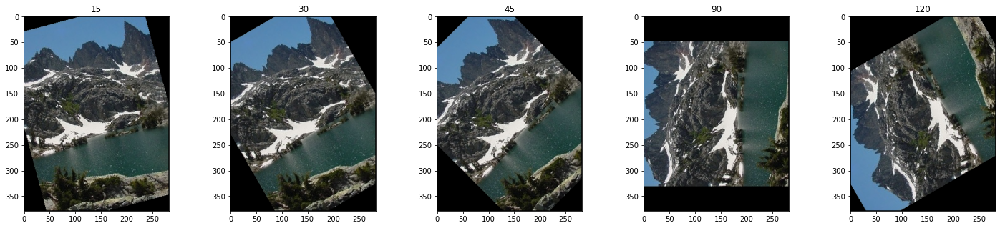

In [23]:
def mat(angle,img):
    
    trans = np.array([[np.cos(np.radians(angle)),-np.sin(np.radians(angle))],[np.sin(np.radians(angle)),np.cos(np.radians(angle))]])
    m,n = img.shape

    top_left = np.array([0,0])
    top_right = np.array([0,n])
    bottom_left = np.array([m,0])
    bottom_right = np.array([m,n])

    points = [top_left,top_right,bottom_left,bottom_right]
    points = np.asarray(points,dtype=np.int64)
    points = points.T
    
    sub = np.array([m//2,n//2],dtype=np.int64).T
    sub = sub.reshape((2,1))
    
    points -= sub # Messing with coordinates

    new_points = trans@points
    new_points = new_points.astype(np.int64)
    return new_points,trans,sub

def rotImage(img,angle,retain):
    org_m, org_n = img.shape

    new_points,trans_mat,addie= mat(angle,img)

    m_min = np.amin(new_points[0,:])
    n_min = np.amin(new_points[1,:])



    add = np.array([np.abs(m_min),np.abs(n_min)],dtype=np.int64).T

    add = add.reshape((2,1))

    new_points += add # Messing with coordinates



    m_max = np.amax(new_points[0,:])
    n_max = np.amax(new_points[1,:])

    new_img = np.zeros((m_max+1,n_max+1),dtype=np.int64)
    final_img = new_img.copy()

    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):

            point = np.array([i,j],dtype=np.int64).T
            point = point.reshape((2,1))
            point = point - add
            new_point = np.linalg.inv(trans_mat)@point

            new_point = new_point.astype(np.int64)

            new_point = new_point + addie


            if new_point[0]>=0 and new_point[0]<org_m and new_point[1]>=0 and new_point[1]<org_n :          
                final_img[i,j] = img[new_point[0],new_point[1]]
            else:
                final_img[i,j] = 0

#     show_img(final_img,0)
    m_new, n_new = final_img.shape
    center = np.array([m_new//2,n_new//2],dtype=np.int64).T
    center = center.reshape((2,1))

    center_top = center[0,0] - org_m//2
    center_bottom = center[0,0] + org_m//2
    center_left = center[1,0] - org_n//2
    center_right = center[1,0] + org_n//2

    if center_top<0:
        center_top=0
    if center_bottom>m_new:
        center_bottom = m_new
    if center_left<0:
        center_left=0
    if center_right>n_new:
        center_right = n_new

#     print(center_left,center_right,center_top,center_bottom)

    temp = final_img[center_top:center_bottom,center_left:center_right]
    m_temp,n_temp = temp.shape
    finalest = np.zeros((org_m,org_n))

    final_top = org_m//2- m_temp//2
    final_bottom = org_m//2+ m_temp//2
    final_left = org_n//2- n_temp//2
    final_right = org_n//2+ n_temp//2

    finalest[final_top:final_bottom,final_left:final_right] = temp
#     show_img(finalest,0)
    
    if retain == 1:
        return finalest
    else:
        return final_img

image = cv2.imread('../images/mountain.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image1 = image[:,:,0]
image2 = image[:,:,1]
image3 = image[:,:,2]

img1 = rotImage(image1,15,1)
img2 = rotImage(image2,15,1)
img3 = rotImage(image3,15,1)

final1 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)
img1 = rotImage(image1,30,1)
img2 = rotImage(image2,30,1)
img3 = rotImage(image3,30,1)

final2 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)

img1 = rotImage(image1,45,1)
img2 = rotImage(image2,45,1)
img3 = rotImage(image3,45,1)

final3 = np.stack([img1, img2, img3], axis=2).astype(np.uint8) 

img1 = rotImage(image1,90,1)
img2 = rotImage(image2,90,1)
img3 = rotImage(image3,90,1)

final4 = np.stack([img1, img2, img3], axis=2).astype(np.uint8) 

img1 = rotImage(image1,120,1)
img2 = rotImage(image2,120,1)
img3 = rotImage(image3,120,1)

final5 = np.stack([img1, img2, img3], axis=2).astype(np.uint8) 

show_img(image,1)
print("Rotating the given image while retaining the original image's dimensions")
plottie_1d(5,[final1,final2,final3,final4,final5], ["15", "30", "45", "90", "120"])

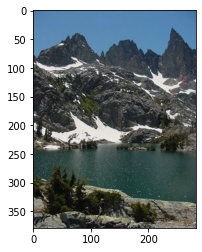

Rotating the given image while not retaining the original image's dimensions


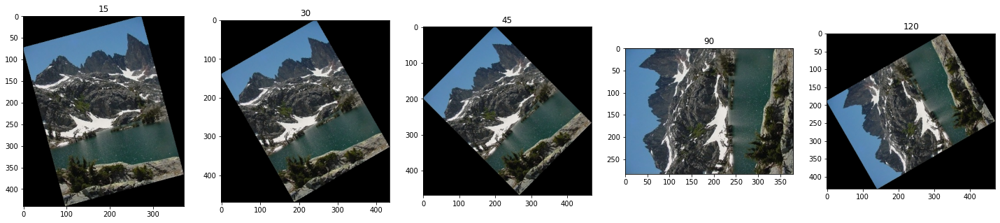

In [415]:
image = cv2.imread('../images/mountain.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image1 = image[:,:,0]
image2 = image[:,:,1]
image3 = image[:,:,2]

img1 = rotImage(image1,15,0)
img2 = rotImage(image2,15,0)
img3 = rotImage(image3,15,0)

final1 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)
img1 = rotImage(image1,30,0)
img2 = rotImage(image2,30,0)
img3 = rotImage(image3,30,0)

final2 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)

img1 = rotImage(image1,45,0)
img2 = rotImage(image2,45,0)
img3 = rotImage(image3,45,0)

final3 = np.stack([img1, img2, img3], axis=2).astype(np.uint8) 

img1 = rotImage(image1,90,0)
img2 = rotImage(image2,90,0)
img3 = rotImage(image3,90,0)

final4 = np.stack([img1, img2, img3], axis=2).astype(np.uint8) 

img1 = rotImage(image1,120,0)
img2 = rotImage(image2,120,0)
img3 = rotImage(image3,120,0)

final5 = np.stack([img1, img2, img3], axis=2).astype(np.uint8) 

show_img(image,1)
print("Rotating the given image while not retaining the original image's dimensions")
plottie_1d(5,[final1,final2,final3,final4,final5], ["15", "30", "45", "90", "120"])

# 6

## Scaling the image

<ipython-input-30-2449164d1de2>:31: RuntimeWarning: overflow encountered in ubyte_scalars
  new_img[i,j] = (img[i_new,j_new] + img[i_new+1,j_new] + img[i_new,j_new+1] + img[i_new+1,j_new+1])//4


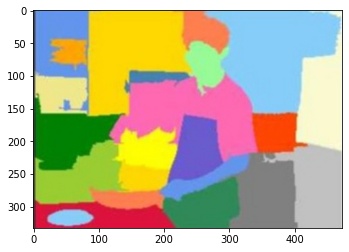

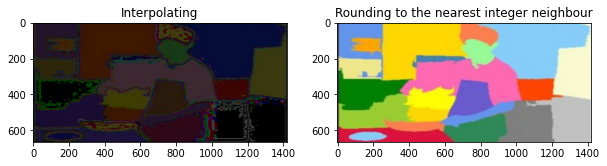

In [30]:
def scaleImage(img,sx,sy,retain):
    m,n = img.shape
    new_img = np.zeros((sx*m,sy*n))
    m_new,n_new = new_img.shape
    for i in range(m_new):
        for j in range(n_new):
            i_new = i//sx
            j_new = j//sy
            if i_new<0 or j_new<0 or i_new>=m or j_new>=n:
                new_img[i,j] = 0
            else:
                new_img[i,j] = img[i_new,j_new]

    return new_img

def scaleImage1(img,sx,sy,retain):
    m,n = img.shape
    new_img = np.zeros((sx*m,sy*n))
    m_new,n_new = new_img.shape
    for i in range(m_new):
        for j in range(n_new):
            i_temp = i/sx
            j_temp = j/sy
            i_new = int((i_temp))
            j_new = int((j_temp))
#             print(i_new,j_new)
            if i_new<0 or j_new<0 or i_new+1>=m or j_new+1>=n:
                new_img[i,j] = 0
            else:
#                 print((img[i_new,j_new] + img[i_new+1,j_new] + img[i_new,j_new+1] + img[i_new+1,j_new+1])//2)
                new_img[i,j] = (img[i_new,j_new] + img[i_new+1,j_new] + img[i_new,j_new+1] + img[i_new+1,j_new+1])//4
#     show_img(new_img,0)
    return new_img
    
image = cv2.imread('../images/label.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# show_img(image,0)


image1 = image[:,:,0]
image2 = image[:,:,1]
image3 = image[:,:,2]

img1 = scaleImage1(image1,2,3,1)
img2 = scaleImage1(image2,2,3,1)
img3 = scaleImage1(image3,2,3,1)

final1 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)

img1 = scaleImage(image1,2,3,1)
img2 = scaleImage(image2,2,3,1)
img3 = scaleImage(image3,2,3,1)

final2 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)


show_img(image,1)

plottie_1d(2,[final1,final2], ["Interpolating", "Rounding to the nearest integer neighbour"])

## How do we upscale by a factor k?

1. We first we create a new image with the new scaled dimensions filled with zeros.
2. Then, we do backward mapping for each pixel of the new image by dividing the x-coordinate with the scaling factor along the x direction and the y-coordinate by the scaling factor along the y direction.

**The main problem arises here**
- We can either choose some form of interpolation method or choose the neared integer value to location of the pixel intensity we want to choose from the original image.

- Suppose we choose an interpolation method (say averaging), we average over all the nearby pixel values, thus corrupting the label (we get a completely new label which never existed in the first place).

- If we choose nearest integer neighbour in the image, we will obtain a label which is already existing thus ensuring that no new labels are created.

**The results of the above method can be seen in the outputs of the above cell**

## Rotating the image

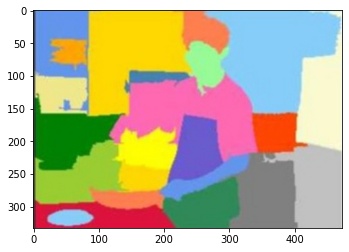

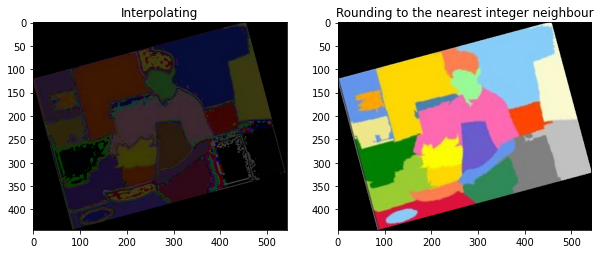

In [29]:
def mat(angle,img):
    
    trans = np.array([[np.cos(np.radians(angle)),-np.sin(np.radians(angle))],[np.sin(np.radians(angle)),np.cos(np.radians(angle))]])
    m,n = img.shape

    top_left = np.array([0,0])
    top_right = np.array([0,n])
    bottom_left = np.array([m,0])
    bottom_right = np.array([m,n])

    points = [top_left,top_right,bottom_left,bottom_right]
    points = np.asarray(points,dtype=np.int64)
    points = points.T
    
    sub = np.array([m//2,n//2],dtype=np.int64).T
    sub = sub.reshape((2,1))
    
    points -= sub # Messing with coordinates

    new_points = trans@points
    new_points = new_points.astype(np.int64)
    return new_points,trans,sub
def rotImage1(img,angle,retain):
    org_m, org_n = img.shape

    new_points,trans_mat,addie= mat(angle,img)

    m_min = np.amin(new_points[0,:])
    n_min = np.amin(new_points[1,:])



    add = np.array([np.abs(m_min),np.abs(n_min)],dtype=np.int64).T

    add = add.reshape((2,1))

    new_points += add # Messing with coordinates



    m_max = np.amax(new_points[0,:])
    n_max = np.amax(new_points[1,:])

    new_img = np.zeros((m_max+1,n_max+1),dtype=np.int64)
    final_img = new_img.copy()

    for i in range(new_img.shape[0]):
        for j in range(new_img.shape[1]):

            point = np.array([i,j],dtype=np.int64).T
            point = point.reshape((2,1))
            point = point - add
            new_point = np.linalg.inv(trans_mat)@point

            new_point = new_point.astype(np.int64)

            new_point = new_point + addie


            if new_point[0]>=0 and new_point[0]+1<org_m and new_point[1]>=0 and new_point[1]+1<org_n :          
                final_img[i,j] = (img[new_point[0],new_point[1]] + img[new_point[0]+1,new_point[1]] + img[new_point[0],new_point[1]+1]+ img[new_point[0]+1,new_point[1]+1])//4
            else:
                final_img[i,j] = 0

#     show_img(final_img,0)
    m_new, n_new = final_img.shape
    center = np.array([m_new//2,n_new//2],dtype=np.int64).T
    center = center.reshape((2,1))

    center_top = center[0,0] - org_m//2
    center_bottom = center[0,0] + org_m//2
    center_left = center[1,0] - org_n//2
    center_right = center[1,0] + org_n//2

    if center_top<0:
        center_top=0
    if center_bottom>m_new:
        center_bottom = m_new
    if center_left<0:
        center_left=0
    if center_right>n_new:
        center_right = n_new

#     print(center_left,center_right,center_top,center_bottom)

    temp = final_img[center_top:center_bottom,center_left:center_right]
    m_temp,n_temp = temp.shape
    finalest = np.zeros((org_m,org_n))

    final_top = org_m//2- m_temp//2
    final_bottom = org_m//2+ m_temp//2
    final_left = org_n//2- n_temp//2
    final_right = org_n//2+ n_temp//2

    finalest[final_top:final_bottom,final_left:final_right] = temp
#     show_img(finalest,0)
    
    if retain == 1:
        return finalest
    else:
        return final_img

image = cv2.imread('../images/label.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image1 = image[:,:,0]
image2 = image[:,:,1]
image3 = image[:,:,2]

img1 = rotImage1(image1,15,0)
img2 = rotImage1(image2,15,0)
img3 = rotImage1(image3,15,0)

final1 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)

img1 = rotImage(image1,15,0)
img2 = rotImage(image2,15,0)
img3 = rotImage(image3,15,0)

final2 = np.stack([img1, img2, img3], axis=2).astype(np.uint8)
show_img(image,1)
plottie_1d(2,[final1,final2], ["Interpolating", "Rounding to the nearest integer neighbour"])

## How do we rotate by angle theta

1. We first we create a new image with the new dimensions filled with zeros.
2. Then, we do backward mapping for each pixel of the new image by multiplying a pixel location with the inverse of the transformation matrix.

**The main problem arises here**
- We can either choose some form of interpolation method or choose the neared integer value to location of the pixel intensity we want to choose from the original image.

- Suppose we choose an interpolation method (say averaging), we average over all the nearby pixel values, thus corrupting the label (we get a completely new label which never existed in the first place).

- If we choose nearest integer neighbour in the image, we will obtain a label which is already existing thus ensuring that no new labels are created.

**The results of the above method can be seen in the outputs of the above cell**